In [1]:
# Load libraries

# # Plotting utils 
import datetime
import glob
import os
import pickle
import time
import warnings
from datetime import date, timedelta
import Ngl
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.util
from cartopy.util import add_cyclic_point
import matplotlib as matplotlib
import matplotlib.animation as animation
import matplotlib.colors as colors
import matplotlib.dates as mdates
import matplotlib.patches as patches
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import FormatStrFormatter
import metpy.calc as mpc
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
import xarray as xr
from matplotlib.dates import DateFormatter
from metpy.units import units
from metpy import interpolate
from metpy.calc import vertical_velocity
from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib as mpl

warnings.filterwarnings('ignore')


In [2]:
def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def get_region(minLat,maxLat,minLon,maxLon, DS, ocnDS = [], ocnMask=False): 
    iLat  = np.where( (DS['lat']>=minLat) & (DS['lat']<=maxLat) )[0]
    iLon  = np.where( (DS['lon']>=minLon) & (DS['lon']<=maxLon) )[0]
    
    if ocnMask==True:
        selOcn = ocnDS[iLat,:]
        
        return selOcn[:,iLon]
            
    return DS.isel(lat=iLat, lon=iLon)

def wgt_rmse(fld1, fld2, wgt):
    """Calculate the area-weighted RMSE.

    Parameters
    ----------
    fld1, fld2 : array-like
        2-dimensional spatial fields with the same shape.
        They can be xarray DataArray or numpy arrays.
    wgt : array-like
        the weight vector, expected to be 1-dimensional,
        matching length of one dimension of the data.

    Returns
    -------
    float
        root mean squared error

    Notes:
    ```rmse = sqrt( mean( (fld1 - fld2)**2 ) )```
    """
    assert len(fld1.shape) == 2,     "Input fields must have exactly two dimensions."
    assert fld1.shape == fld2.shape, "Input fields must have the same array shape."
    # in case these fields are in dask arrays, compute them now.
    if hasattr(fld1, "compute"):
        fld1 = fld1.compute()
    if hasattr(fld2, "compute"):
        fld2 = fld2.compute()
    if isinstance(fld1, xr.DataArray) and isinstance(fld2, xr.DataArray):
        return (np.sqrt(((fld1 - fld2)**2).weighted(wgt).mean())).values.item()
    else:
        check = [len(wgt) == s for s in fld1.shape]
        if ~np.any(check):
            raise IOError(f"Sorry, weight array has shape {wgt.shape} which is not compatible with data of shape {fld1.shape}")
        check = [len(wgt) != s for s in fld1.shape]
        dimsize = fld1.shape[np.argwhere(check).item()]  # want to get the dimension length for the dim that does not match the size of wgt
        warray = np.tile(wgt, (dimsize, 1)).transpose()   # May need more logic to ensure shape is correct.
        warray = warray / np.sum(warray) # normalize
        wmse = np.sum(warray * (fld1 - fld2)**2)
    
    return np.sqrt( wmse ).item()

    

In [3]:
# Grabbed from Brian M. to use time midpoints, not end periods
def cesm_correct_time(ds):
    """Given a Dataset, check for time_bnds,
       and use avg(time_bnds) to replace the time coordinate.
       Purpose is to center the timestamp on the averaging inverval.   
       NOTE: ds should have been loaded using `decode_times=False`
    """
    assert 'time_bnds' in ds
    assert 'time' in ds
    correct_time_values = ds['time_bnds'].mean(dim='nbnd')
    # copy any metadata:
    correct_time_values.attrs = ds['time'].attrs
    ds = ds.assign_coords({"time": correct_time_values})
    ds = xr.decode_cf(ds)  # decode to datetime objects
    return ds

In [4]:
# - - - - - - - - - - - - - - - 
# Pre-process data while reading in 
# - - - - - - - - - - - - - - - 

def preprocess_h0(ds):
    
    keepVars_noGust = ['SWCF','LWCF','TS','CLOUD','FSNS','FLNS','PS',
                    'U10','CLDHGH','CLDLIQ','TMQ',
                    'PHIS','CDNUMC','CLDLOW',
                    'CLDMED','CLDTOT','RVMTEND_CLUBB','STEND_CLUBB',
                    'T','Q','OMEGA','PBLH','U','V','Z3',
                    'PRECT','PRECC','PRECL','LANDFRAC','OCNFRAC', 'ICEFRAC',
                    'TGCLDLWP','LHFLX','SHFLX','TREFHT', 'TAUX','TAUY',
                    'hyam','hybm','hyai','hybi']
    keepVars_gust = ['SWCF','LWCF','TS','CLOUD','FSNS','FLNS','PS',
                    'U10', 'UGUST','CLDHGH','CLDLIQ','TMQ',
                    'PHIS','CDNUMC','CLDLOW',
                    'CLDMED','CLDTOT','RVMTEND_CLUBB','STEND_CLUBB',
                    'T','Q','OMEGA','PBLH','U','V','Z3',
                    'PRECT','PRECC','PRECL','LANDFRAC','OCNFRAC','ICEFRAC',
                    'TGCLDLWP','LHFLX','SHFLX','TREFHT', 'TAUX','TAUY', 
                    'hyam','hybm','hyai','hybi']        
        
    ds         = cesm_correct_time(ds)
    # ds['time'] = ds.indexes['time'].to_datetimeindex() 
    varnames = list(ds.keys())

    if 'UGUST' in varnames: 
        dsSel      = ds[keepVars_gust]
    else: 
        dsSel      = ds[keepVars_noGust]
        #dsSel['UGUST'] = (('time','lat','lon'), np.full([len(dsSel.time.values), len(dsSel.lat.values), len(dsSel.lon.values)], 0))
    
    return dsSel


def preprocess_h2(ds):
       
    keepVars = ['PRECC','PRECT','U850']
        
    ds         = cesm_correct_time(ds)
    # ds['time'] = ds.indexes['time'].to_datetimeindex() 
    dsSel      = ds[keepVars]

    
    return dsSel



In [5]:
def regrid_data(fromthis, tothis, method=1):
    """Regrid data using various different methods"""

    #Import necessary modules:
    import xarray as xr

    if method == 1:
        # kludgy: spatial regridding only, seems like can't automatically deal with time
        if 'time' in fromthis.coords:
            result = [fromthis.isel(time=t).interp_like(tothis) for t,time in enumerate(fromthis['time'])]
            result = xr.concat(result, 'time')
            return result
        else:
            return fromthis.interp_like(tothis)
    elif method == 2:
        newlat = tothis['lat']
        newlon = tothis['lon']
        coords = dict(fromthis.coords)
        coords['lat'] = newlat
        coords['lon'] = newlon
        return fromthis.interp(coords)
    elif method == 3:
        newlat = tothis['lat']
        newlon = tothis['lon']
        ds_out = xr.Dataset({'lat': newlat, 'lon': newlon})
        regridder = xe.Regridder(fromthis, ds_out, 'bilinear')
        return regridder(fromthis)
    elif method==4:
        # geocat
        newlat = tothis['lat']
        newlon = tothis['lon']
        result = geocat.comp.linint2(fromthis, newlon, newlat, False)
        result.name = fromthis.name
        
        return result

## Set up dask

In [6]:
import dask
dask.config.set({'logging.distributed': 'error'})


In [7]:
from dask_jobqueue import PBSCluster

# For Casper
cluster = PBSCluster(
    queue="casper",
    walltime="02:00:00",
    project="P93300642",
    memory="4GB",
    resource_spec="select=1:ncpus=1:mem=4GB",
    cores=1,
    processes=1,
)


In [8]:
from dask.distributed import Client

# Connect client to the remote dask workers
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/35291/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/35291/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://128.117.208.95:43911,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/mdfowler/proxy/35291/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [9]:
cluster.scale(24)


In [10]:
client.wait_for_workers(24)


In [133]:
!qstat -u $USER

                                                            Req'd  Req'd   Elap
Job ID          Username Queue    Jobname    SessID NDS TSK Memory Time  S Time
--------------- -------- -------- ---------- ------ --- --- ------ ----- - -----
9850332.casper* mdfowler htc      STDIN        7602   1   1   24gb 08:10 R 02:10


## Read in case data

In [11]:
%%time 
testDir     = '/glade/derecho/scratch/hannay/archive/'

case_IDs  = [
               # 'BLT1850_054ctrl',
               # 'BLT1850_064gust',    
               'BLT1850_078b_oldGust',
               'BLT1850_082b_1xGust',   
               'BLT1850_081b_3xGust',   
               'BLT1850_083b_0xGust',   

              ]

caseNames = [
            'b.e23_alpha16g.BLT1850.ne30_t232.078b', 
            'b.e23_alpha16g.BLT1850.ne30_t232.082b',
            'b.e23_alpha16g.BLT1850.ne30_t232.081b',
            'b.e23_alpha16g.BLT1850.ne30_t232.083b']
    
for iCase in range(len(case_IDs)):
    print('*** Starting on case %s ***' % (case_IDs[iCase]))

    # ## Get list of files with certain years only
    # listFiles_h0_1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.000?-*'))
    # listFiles_h1_1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.000?-*'))
    
    # listFiles_h0_2 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.001?-*'))
    # listFiles_h1_2 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.001?-*'))  
    
    # listFiles_h0_3 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.002?-*'))
    # listFiles_h1_3 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.002?-*'))  
    
    # listFiles_h0 = np.concatenate([listFiles_h0_1, listFiles_h0_2, listFiles_h0_3])
    # listFiles_h1 = np.concatenate([listFiles_h1_1, listFiles_h1_2, listFiles_h1_3])

    ## Select just the beginning period too 
    listFiles_h0 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.????-*'))[0:(30*12)]
    listFiles_h1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.????-*'))[0:(30*19)]
    
    ## Now read in those files
    case_h0 = xr.open_mfdataset(listFiles_h0,  preprocess=preprocess_h0, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h0 files loaded')
    case_h1 = xr.open_mfdataset(listFiles_h1,  preprocess=preprocess_h2, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h1 files loaded')
    
    ## Add case ID (short name) to the DS
    case_h0      = case_h0.squeeze().assign_coords({"case":  case_IDs[iCase]})
    case_h1      = case_h1.squeeze().assign_coords({"case":  case_IDs[iCase]})
    
    # ## Info on dates available
    # print('Min year (h0): ', np.nanmin(case_h0['time.year'].values))
    # print('Max year (h0): ', np.nanmax(case_h0['time.year'].values))
    # print('Min year (h1): ', np.nanmin(case_h1['time.year'].values))
    # print('Max year (h1): ', np.nanmax(case_h1['time.year'].values))
    
    ## Return all the cases in a single dataset
    if iCase==0:
        all_h0    = case_h0
        del case_h0
        all_h1 = case_h1
        del case_h1
    else: 
        all_h0    = xr.concat([all_h0, case_h0], "case") 
        del case_h0
        all_h1 = xr.concat([all_h1, case_h1], "case") 
        del case_h1
    

*** Starting on case BLT1850_078b_oldGust ***
h0 files loaded
h1 files loaded
*** Starting on case BLT1850_082b_1xGust ***
h0 files loaded
h1 files loaded
*** Starting on case BLT1850_081b_3xGust ***
h0 files loaded
h1 files loaded
*** Starting on case BLT1850_083b_0xGust ***
h0 files loaded
h1 files loaded
CPU times: user 6min 36s, sys: 32 s, total: 7min 8s
Wall time: 26min 15s


In [15]:
# weights = np.cos(np.deg2rad(all_h0.lat))
# weights.name = "weights"
# weights

# plt.plot(all_h0.isel(case=0).LHFLX.weighted(weights).mean(("lon", "lat")), 'k', label='case0')
# plt.plot(all_h0.isel(case=1).LHFLX.weighted(weights).mean(("lon", "lat")), 'b', label='case1')
# plt.plot(all_h0.isel(case=2).LHFLX.weighted(weights).mean(("lon", "lat")), 'r', label='case2')
# plt.legend()
# # plt.xlim([170,200])


In [12]:
## Drop the first year for spin-up? And select only the years that we want?

iTimes_h0 = np.where((all_h0['time.year'].values>1) & (all_h0['time.year'].values<=58))[0]
iTimes_h1 = np.where((all_h1['time.year'].values>1) & (all_h1['time.year'].values<=58))[0]

all_h0 = all_h0.isel(time=iTimes_h0)
all_h1 = all_h1.isel(time=iTimes_h1)


In [13]:
## Also create ocean-only frac
fillOcnFrac_h0= np.full([2, len(all_h0.lat.values), len(all_h0.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:] = all_h0.OCNFRAC.isel(case=0, time=0)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan
## Get means 
fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]
## Also create ocean-only frac with time dimension
fillOcnFrac_h0_allTimes= np.full([len(all_h0.time.values), len(all_h0.lat.values), len(all_h0.lon.values)], np.nan)
fillOcnFrac_h0_allTimes[:,:,:] = all_h0.OCNFRAC.isel(case=0)
fillOcnFrac_h0_allTimes[np.where(fillOcnFrac_h0_allTimes!=1)] = np.nan


In [9]:
# all_h0['time'] = all_h0.indexes['time'].to_datetimeindex() 
# all_h1['time'] = all_h1.indexes['time'].to_datetimeindex() 


## Plot comparison?

In [22]:
import matplotlib as mpl


In [21]:
longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


In [15]:
print(all_h0.time.dt.year.values[0], all_h0.time.dt.year.values[-1])

2 28


Years:  2 - 28


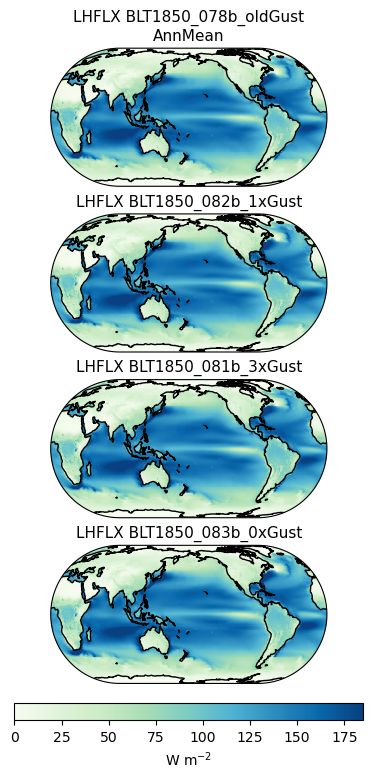

In [16]:
varSel = 'LHFLX'
var_norm = mpl.colors.Normalize(vmin=0, vmax=185)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='GnBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='GnBu'), ax=ax, shrink=0.3, label='W m$^{-2}$', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


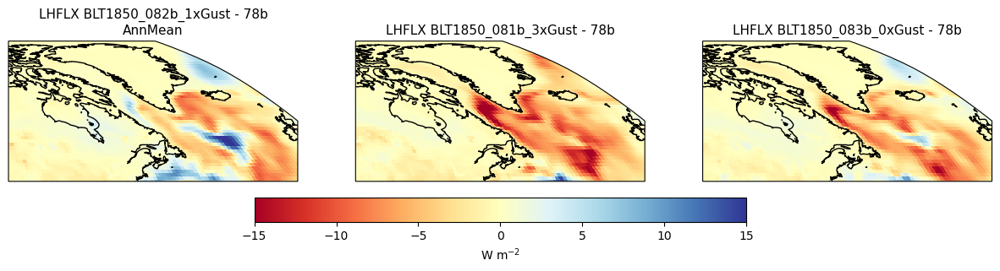

In [32]:
varSel = 'LHFLX'
var_norm = mpl.colors.Normalize(vmin=-15, vmax=15)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([280,340,40,85],crs=ccrs.PlateCarree()) for a in ax]  ## Lab Sea
# [a.set_extent([50,210,-25,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific


cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='W m$^{-2}$', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 30


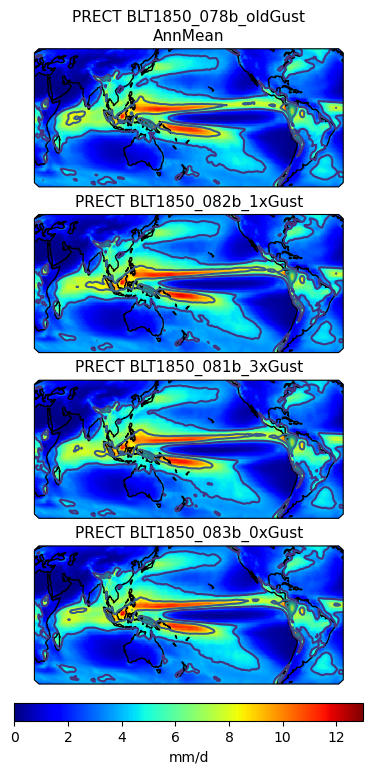

In [60]:
varSel = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=0, vmax=13)
varMult = 86400*1e3


longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, varMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='jet') 
    c = ax[iInd].contour(longrid,latgrid,varMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values,transform=ccrs.PlateCarree())
    
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([40,260,-25,25]) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='jet'), ax=ax, shrink=0.3, label='mm/d', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


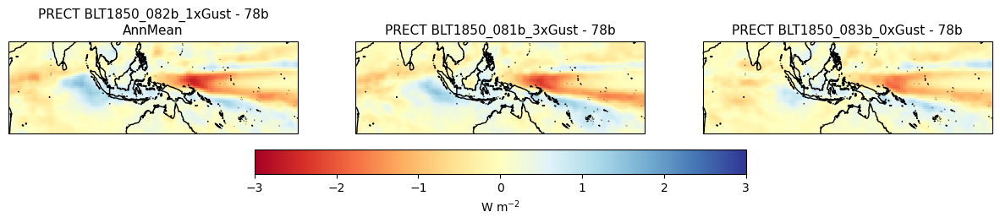

In [36]:
varSel = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
unitsStr = 'mm d$^{-1}$'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               varMult*(all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([50,210,-25,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific


cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='W m$^{-2}$', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 28


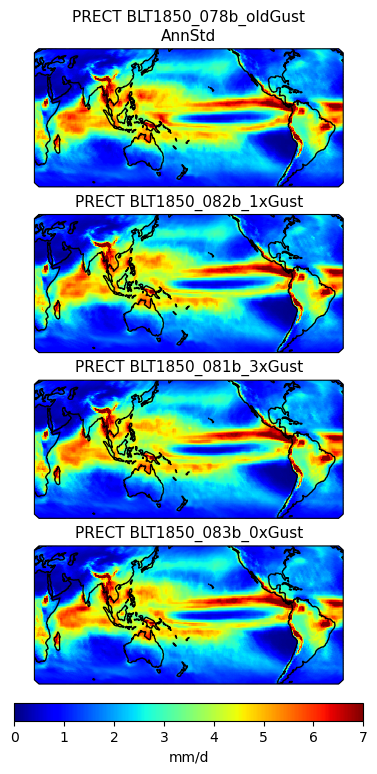

In [20]:
varSel = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=0, vmax=7)
varMult = 86400*1e3


longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, varMult*all_h0[varSel].isel(case=iInd).std(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='jet') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnStd', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([40,260,-25,25]) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='jet'), ax=ax, shrink=0.3, label='mm/d', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


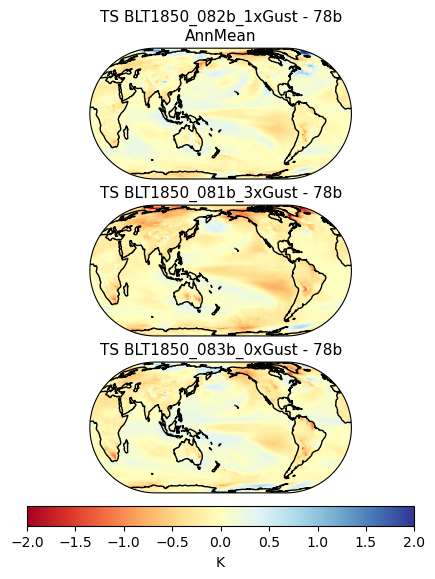

In [24]:
varSel = 'TS'
var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='K', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 30


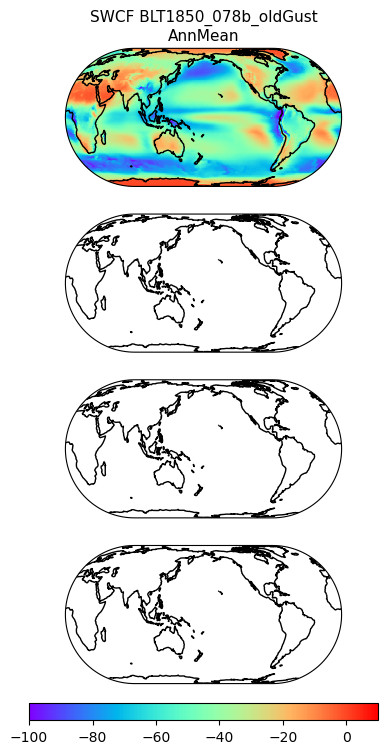

In [44]:
varSel = 'SWCF'
var_norm = mpl.colors.Normalize(vmin=-100, vmax=10)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})

# for iInd in range(len(all_h0.case.values)):
for iInd in range(1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='rainbow') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='rainbow'), ax=ax, shrink=0.3, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


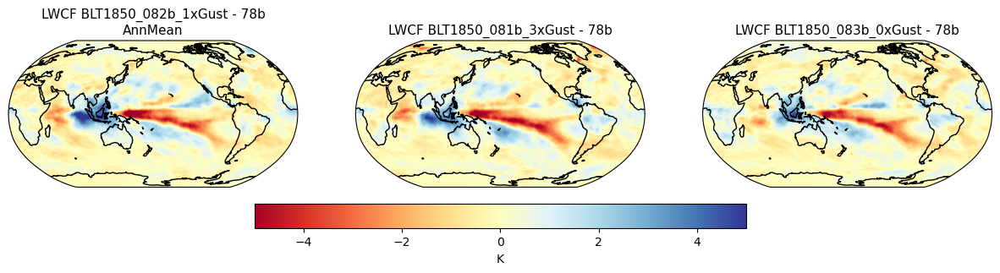

In [38]:
varSel = 'LWCF'
var_norm = mpl.colors.Normalize(vmin=-5, vmax=5)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='K', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


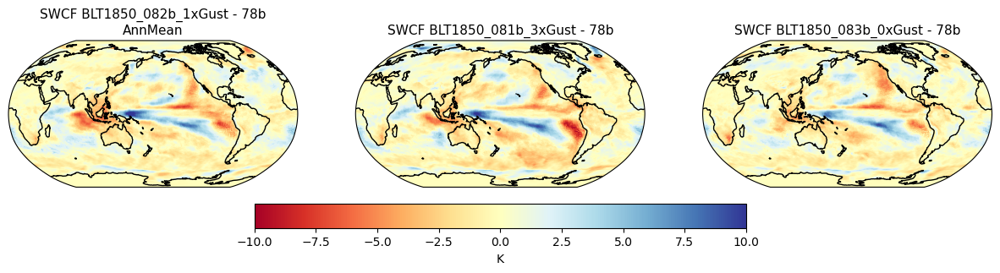

In [39]:
varSel = 'SWCF'
var_norm = mpl.colors.Normalize(vmin=-10, vmax=10)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='K', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


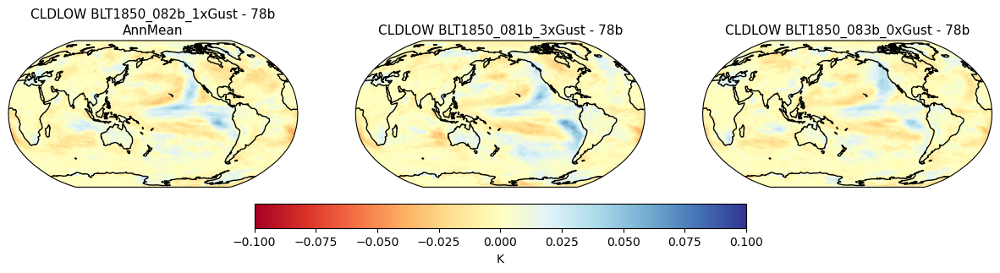

In [49]:
varSel = 'CLDLOW'
var_norm = mpl.colors.Normalize(vmin=-0.1, vmax=0.1)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='K', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


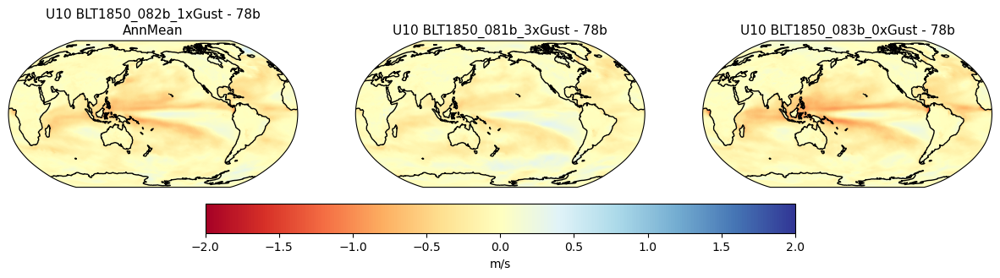

In [192]:
varSel = 'U10'
var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.6, label='m/s', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 28


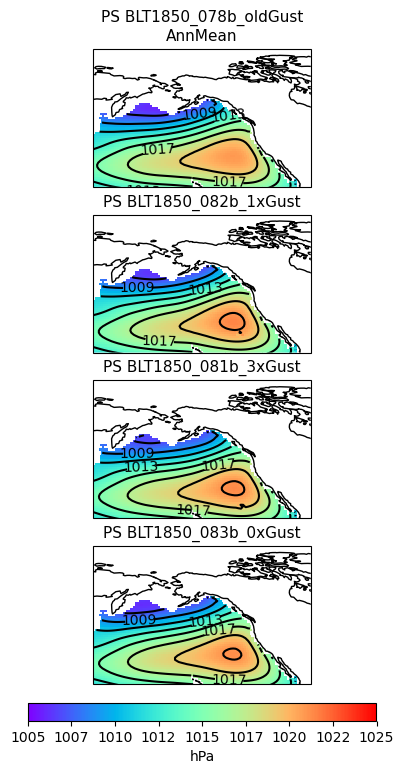

In [116]:
varSel = 'PS'
var_norm = mpl.colors.Normalize(vmin=1005, vmax=1025)
valMult = 0.01

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               fillOcnFrac_h0_mean*valMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='rainbow') 
    img2 = ax[iInd].contour(longrid, latgrid, 
                               fillOcnFrac_h0_mean*valMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               levels=np.arange(1005,1025,2),
                               transform=ccrs.PlateCarree(),colors='black')
    ax[iInd].clabel(img2, np.arange(1005,1025,2)[::2], fontsize=10)
    
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([150,260,20,90],crs=ccrs.PlateCarree()) for a in ax]   ## Pacific High Region

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='rainbow'), ax=ax, shrink=0.3, label='hPa', orientation='horizontal', pad=0.025, format='%i') 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


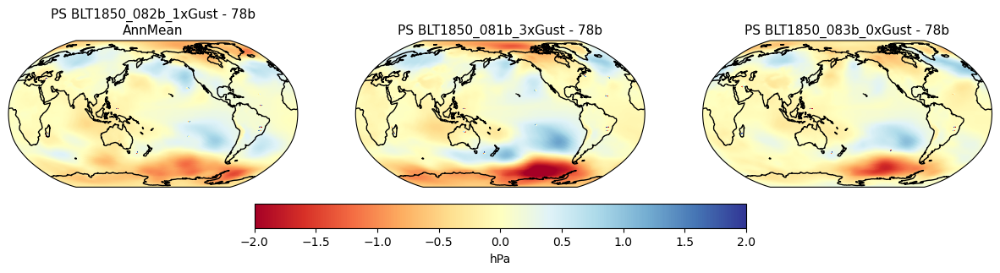

In [50]:
varSel = 'PS'
var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)
valMult = 0.01

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([180,180,30,90],crs=ccrs.PlateCarree()) for a in ax]   ## Pacific High Region

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='hPa', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 28


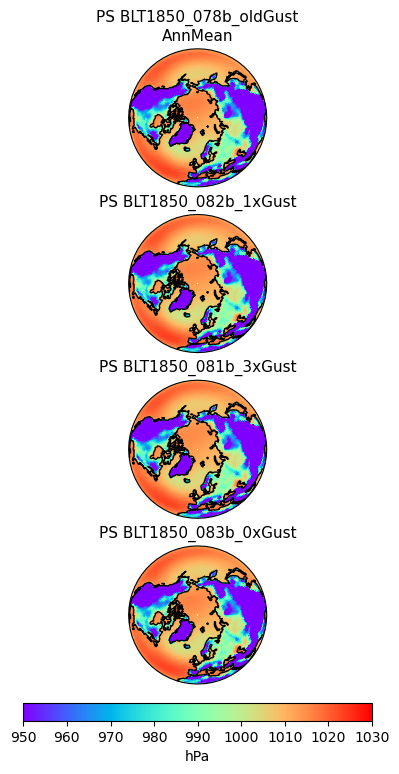

In [44]:
varSel = 'PS'
var_norm = mpl.colors.Normalize(vmin=950, vmax=1030)
valMult = 0.01

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, valMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='rainbow') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='rainbow'), ax=ax, shrink=0.3, label='hPa', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


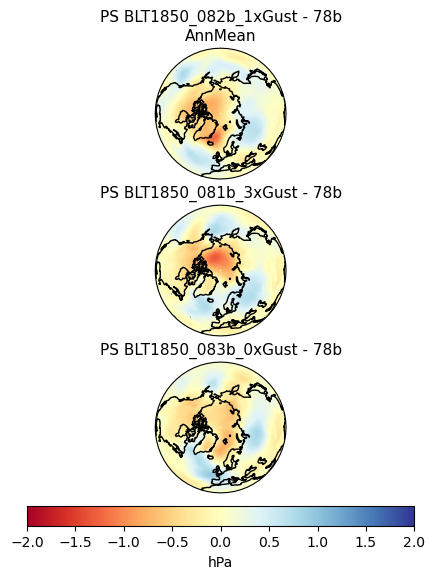

In [42]:
varSel = 'PS'
var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)
valMult = 0.01

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})
for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='hPa', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


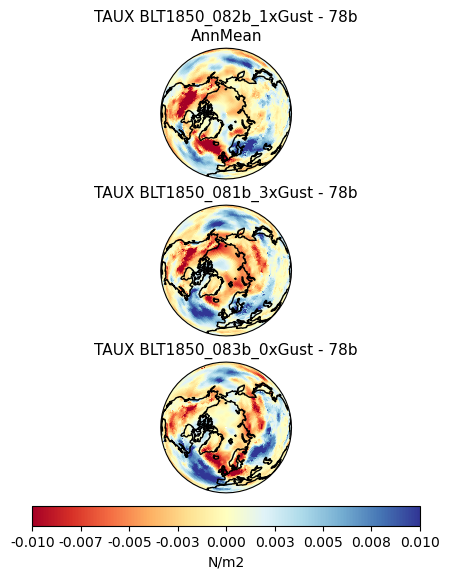

In [46]:
varSel = 'TAUX'
# varSel = 'TAUY'
var_norm = mpl.colors.Normalize(vmin=-1e-2, vmax=1e-2)
valMult = 1

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})
for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='N/m2', orientation='horizontal', pad=0.025, format='%.3f') 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


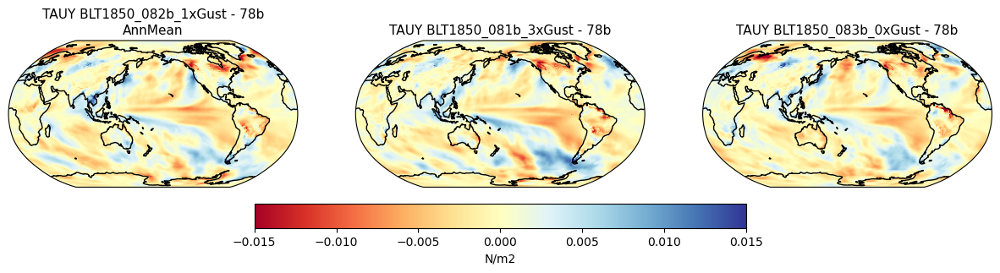

In [57]:
varSel = 'TAUY'
var_norm = mpl.colors.Normalize(vmin=-1.5e-2, vmax=1.5e-2)
valMult = 1

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).mean(dim='time').values - all_h0[varSel].isel(case=0).mean(dim='time').values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+' - 78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([180,180,30,90],crs=ccrs.PlateCarree()) for a in ax]   ## Pacific High Region

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label='N/m2', orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


**Deal with 3D variables**

Years:  2 - 28


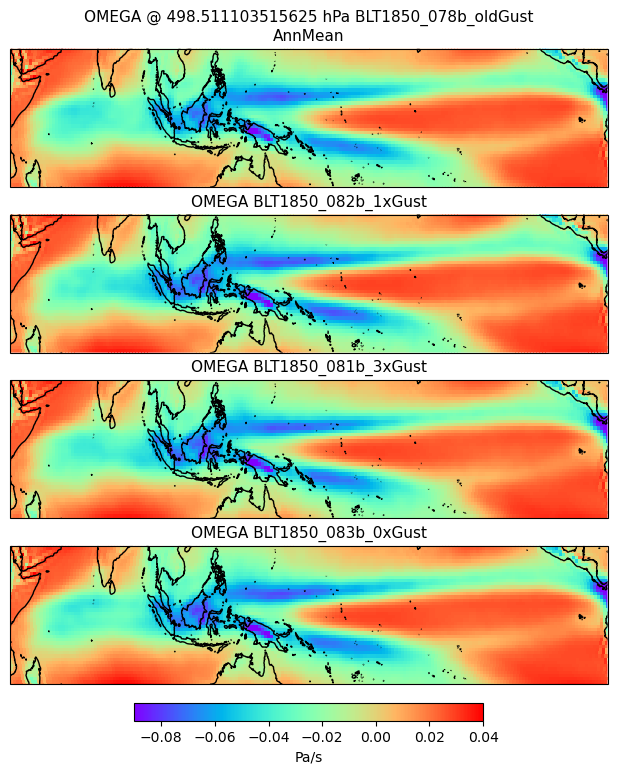

In [94]:
varSel = 'OMEGA'
levSel = 500
var_norm = mpl.colors.Normalize(vmin=-0.09, vmax=0.04)
valMult = 1
unitsStr=all_h0.OMEGA.units
cmapSel = 'rainbow'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, valMult*all_h0[varSel].isel(case=iInd).sel(lev=levSel,method='nearest').mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(varSel+' @ '+str(all_h0[varSel].sel(lev=levSel,method='nearest').lev.values)+' hPa '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([40,280,-20,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 28


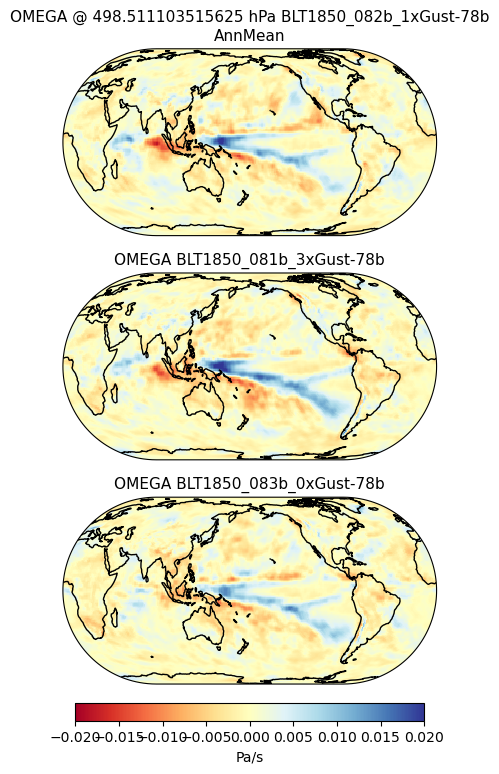

In [96]:
varSel = 'OMEGA'
levSel = 500
var_norm = mpl.colors.Normalize(vmin=-0.02, vmax=0.02)
valMult = 1
unitsStr=all_h0.OMEGA.units
cmapSel = 'RdYlBu'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

ctrl = all_h0[varSel].isel(case=0).sel(lev=levSel,method='nearest').mean(dim='time').values

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).sel(lev=levSel,method='nearest').mean(dim='time').values - ctrl), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(varSel+' @ '+str(all_h0[varSel].sel(lev=levSel,method='nearest').lev.values)+' hPa '+str(all_h0[varSel].isel(case=iInd+1).case.values)+'-78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([40,280,-20,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


In [98]:
all_h0.Z3.sel(lev=500,method='nearest').mean().values

array(5775.1543, dtype=float32)

Years:  2 - 28


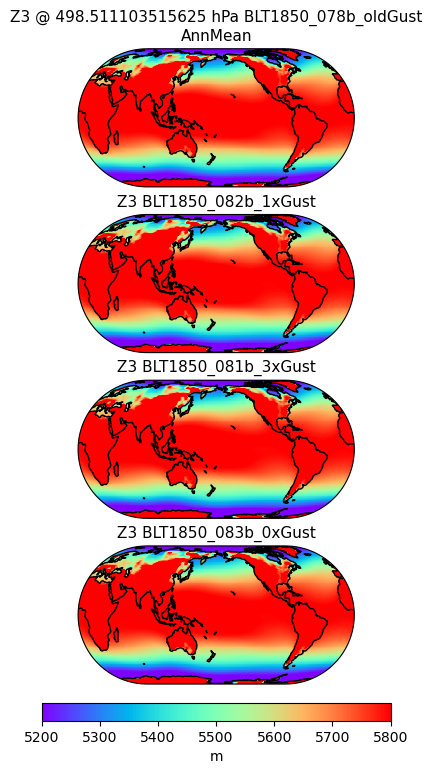

In [102]:
varSel = 'Z3'
levSel = 500
var_norm = mpl.colors.Normalize(vmin=5200, vmax=5800)
valMult = 1
unitsStr=all_h0.Z3.units
cmapSel = 'rainbow'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(all_h0.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               # fillOcnFrac_h0_mean*valMult*all_h0[varSel].isel(case=iInd).sel(lev=levSel,method='nearest').mean(dim='time').values, 
                               # valMult*all_h0[varSel].isel(case=iInd).sel(lev=levSel,method='nearest').mean(dim='time').values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(varSel+' @ '+str(all_h0[varSel].sel(lev=levSel,method='nearest').lev.values)+' hPa '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([40,280,-20,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


Years:  2 - 28


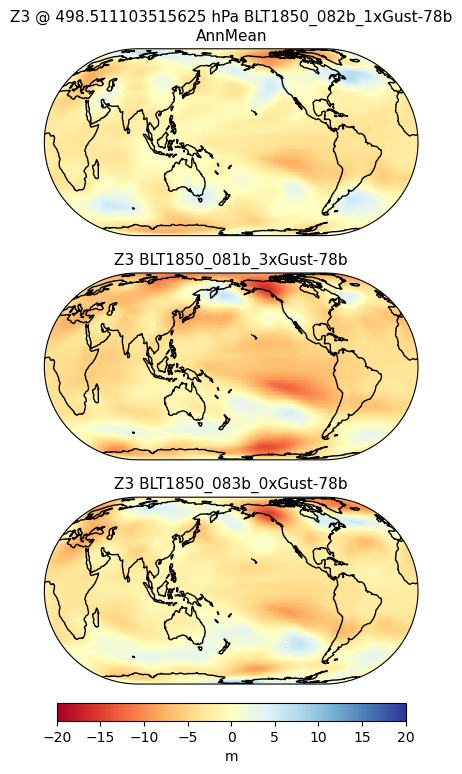

In [103]:
varSel = 'Z3'
levSel = 500
var_norm = mpl.colors.Normalize(vmin=-20, vmax=20)
valMult = 1
unitsStr=all_h0.Z3.units
cmapSel = 'RdYlBu'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

ctrl = all_h0[varSel].isel(case=0).sel(lev=levSel,method='nearest').mean(dim='time').values

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
# fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})

for iInd in range(len(all_h0.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               valMult*(all_h0[varSel].isel(case=iInd+1).sel(lev=levSel,method='nearest').mean(dim='time').values - ctrl), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(varSel+' @ '+str(all_h0[varSel].sel(lev=levSel,method='nearest').lev.values)+' hPa '+str(all_h0[varSel].isel(case=iInd+1).case.values)+'-78b\nAnnMean', fontsize=11)
    else:
        ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([40,280,-20,20],crs=ccrs.PlateCarree()) for a in ax]   ## West Pacific

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


**Pick a season**

In [58]:
month_length = all_h0.time.dt.days_in_month

# Calculate the weights by grouping by 'time.season'.
weights = (
    month_length.groupby("time.season") / month_length.groupby("time.season").sum()
)

# Test that the sum of the weights for each season is 1.0
np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
ds_weighted = (all_h0 * weights).groupby("time.season").sum(dim="time")



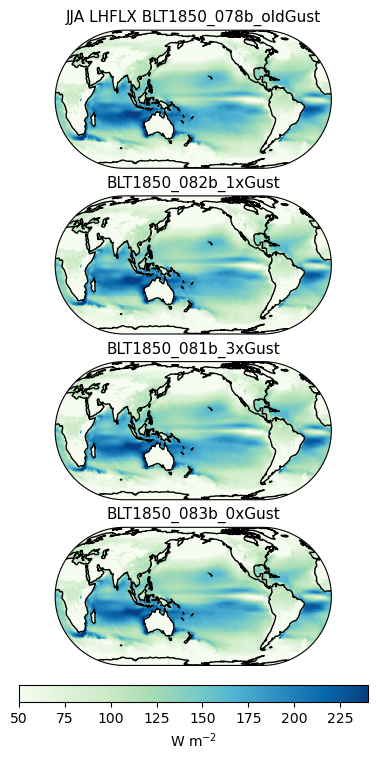

In [69]:
iSeason = 'JJA'

varSel = 'LHFLX'
var_norm = mpl.colors.Normalize(vmin=50, vmax=240)
cmapSel = 'GnBu'
unitsStr = 'W m$^{-2}$'


longrid, latgrid = np.meshgrid(ds_weighted['lon'], ds_weighted['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(ds_weighted.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(ds_weighted.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, ds_weighted[varSel].sel(season=iSeason).isel(case=iInd).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([0,359,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


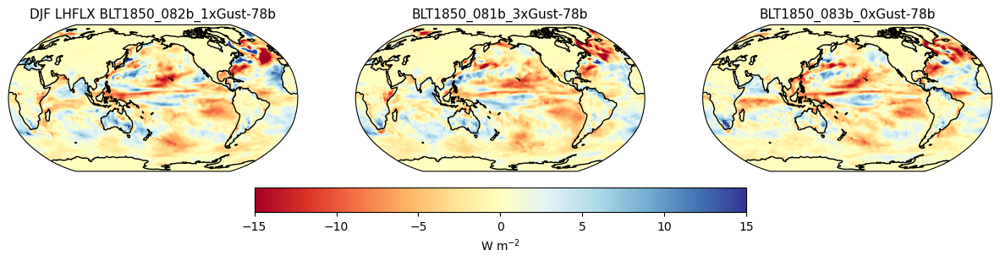

In [59]:
iSeason = 'DJF'
varSel = 'LHFLX'
var_norm = mpl.colors.Normalize(vmin=-15, vmax=15)
unitsStr = 'W m$^{-2}$'


longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(ds_weighted.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(ds_weighted.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               ds_weighted[varSel].sel(season=iSeason).isel(case=iInd+1).values - ds_weighted[varSel].sel(season=iSeason).isel(case=0).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([:,:,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


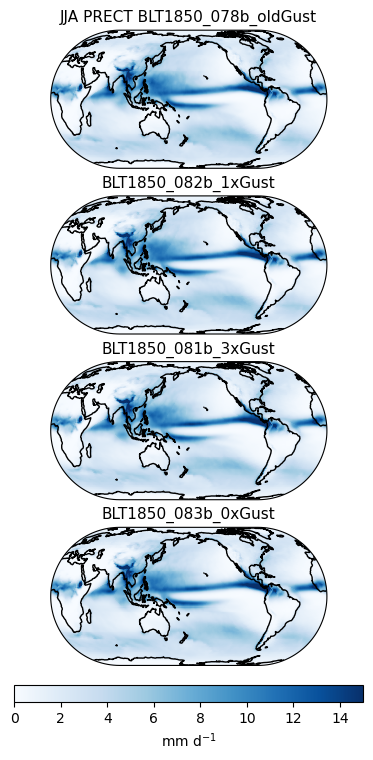

In [71]:
iSeason = 'JJA'

varSel = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=0, vmax=15)
cmapSel = 'Blues'
varMult = 86400*1e3
unitsStr = 'mm d$^{-1}$'

longrid, latgrid = np.meshgrid(ds_weighted['lon'], ds_weighted['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(ds_weighted.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(ds_weighted.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, varMult*ds_weighted[varSel].sel(season=iSeason).isel(case=iInd).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([0,359,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


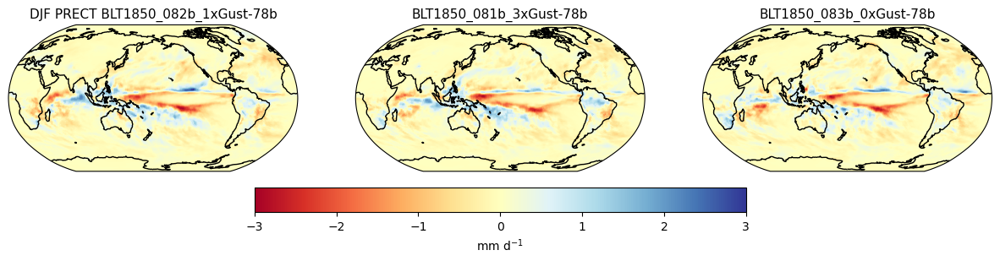

In [61]:
iSeason = 'DJF'
varSel = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
unitsStr = 'mm d$^{-1}$'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(ds_weighted.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
fig, ax = plt.subplots(ncols=len(all_h0.case.values)-1, figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})

for iInd in range(len(ds_weighted.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               varMult*(ds_weighted[varSel].sel(season=iSeason).isel(case=iInd+1).values - ds_weighted[varSel].sel(season=iSeason).isel(case=0).values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([:,:,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


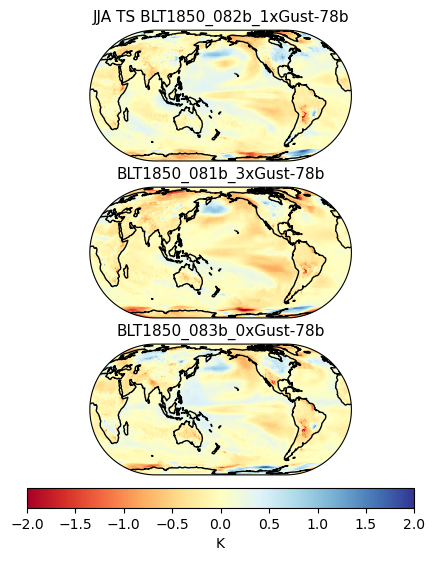

In [73]:
iSeason = 'JJA'
varSel = 'TS'
var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)
varMult = 1
unitsStr = 'K'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(ds_weighted.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(ds_weighted.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               varMult*(ds_weighted[varSel].sel(season=iSeason).isel(case=iInd+1).values - ds_weighted[varSel].sel(season=iSeason).isel(case=0).values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([:,:,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


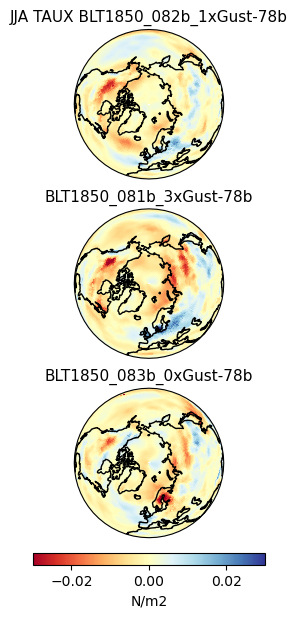

In [76]:
iSeason = 'JJA'

# varSel = 'TS'
# var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)
# varMult = 1
# unitsStr = 'K'

# varSel = 'PS'
# var_norm = mpl.colors.Normalize(vmin=-2, vmax=2)
# varMult = 0.01
# unitsStr = 'hPa'

varSel = 'TAUX'
var_norm = mpl.colors.Normalize(vmin=-3e-2, vmax=3e-2)
varMult = 1
unitsStr = 'N/m2'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(all_h0.case.values)-1, figsize=(10,8), subplot_kw={"projection":ccrs.NearsidePerspective(central_longitude=0.0, central_latitude=90.0, satellite_height=35785831, false_easting=0, false_northing=0)})

for iInd in range(len(ds_weighted.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               varMult*(ds_weighted[varSel].sel(season=iSeason).isel(case=iInd+1).values - ds_weighted[varSel].sel(season=iSeason).isel(case=0).values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([:,:,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


In [ ]:
# varSel = 'PS'
# var_norm = mpl.colors.Normalize(vmin=1005, vmax=1025)
# valMult = 0.01

# longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# print('Years: ',all_h0.time.dt.year.values[0],'-',all_h0.time.dt.year.values[-1])

# # Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
# for iInd in range(len(all_h0.case.values)):
#     img1 = ax[iInd].pcolormesh(longrid, latgrid, 
#                                fillOcnFrac_h0_mean*valMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
#                                transform=ccrs.PlateCarree(), norm=var_norm, cmap='rainbow') 
#     img2 = ax[iInd].contour(longrid, latgrid, 
#                                fillOcnFrac_h0_mean*valMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values, 
#                                levels=np.arange(1005,1025,2),
#                                transform=ccrs.PlateCarree(),colors='black')
#     ax[iInd].clabel(img2, np.arange(1005,1025,2)[::2], fontsize=10)
    
#     if iInd==0:
#         ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'\nAnnMean', fontsize=11)
#     else:
#         ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values), fontsize=11)

# [a.coastlines() for a in ax]
# [a.set_extent([150,260,20,90],crs=ccrs.PlateCarree()) for a in ax]   ## Pacific High Region

# cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='rainbow'), ax=ax, shrink=0.3, label='hPa', orientation='horizontal', pad=0.025, format='%i') 
# # cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


In [ ]:
iSeason = 'JJA'

varSel = 'PS'
var_norm = mpl.colors.Normalize(vmin=1009, vmax=1031)
cmapSel = 'rainbow'
varMult = 0.01
unitsStr = 'hPa'

longrid, latgrid = np.meshgrid(ds_weighted['lon'], ds_weighted['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(ds_weighted.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.EckertIV(central_longitude=180)})
for iInd in range(len(ds_weighted.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               fillOcnFrac_h0_mean*varMult*ds_weighted[varSel].sel(season=iSeason).isel(case=iInd).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    img2 = ax[iInd].contour(longrid, latgrid, 
                            fillOcnFrac_h0_mean*varMult*ds_weighted[varSel].sel(season=iSeason).isel(case=iInd).values, 
                                levels=np.arange(1005,1031,2),
                               transform=ccrs.PlateCarree(), colors='black')
    ax[iInd].clabel(img2, np.arange(1005,1031,2)[::2], fontsize=10)
    
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([0,359,-60,70], crs=ccrs.PlateCarree()) for a in ax]
[a.set_extent([150,260,20,90],crs=ccrs.PlateCarree()) for a in ax]   ## Pacific High Region

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


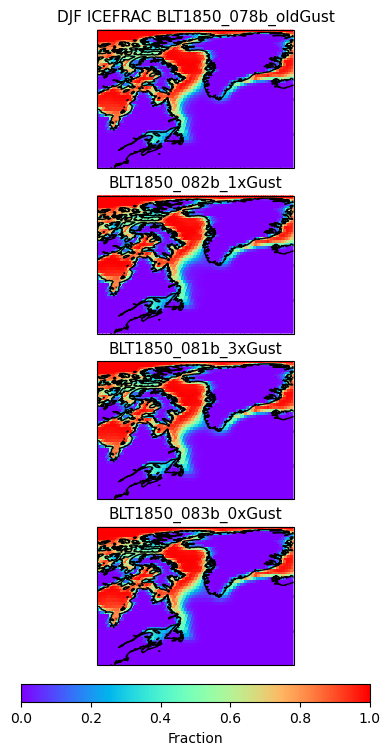

In [52]:
iSeason = 'DJF'

varSel = 'ICEFRAC'
var_norm = mpl.colors.Normalize(vmin=0, vmax=1)
cmapSel = 'rainbow'
varMult = 1
unitsStr = 'Fraction'

longrid, latgrid = np.meshgrid(ds_weighted['lon'], ds_weighted['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(ds_weighted.case.values), figsize=(15,10), subplot_kw={"projection":ccrs.Robinson()})
for iInd in range(len(ds_weighted.case.values)):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, varMult*ds_weighted[varSel].sel(season=iSeason).isel(case=iInd).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd).case.values), fontsize=11)

[a.coastlines() for a in ax]
[a.set_extent([280,340,40,85],crs=ccrs.PlateCarree()) for a in ax]

# [a.set_extent([0,359,-60,70], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.3, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


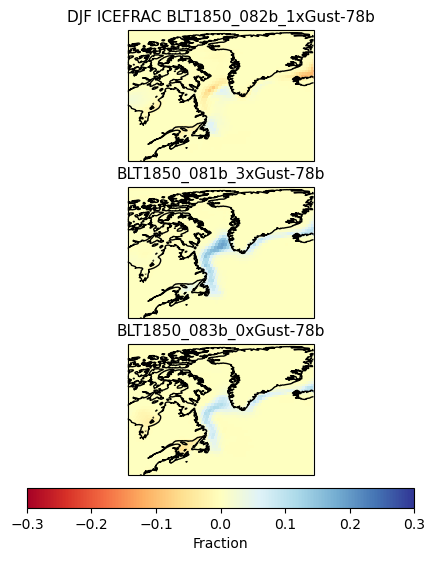

In [53]:
iSeason = 'DJF'
varSel = 'ICEFRAC'
var_norm = mpl.colors.Normalize(vmin=-0.3, vmax=0.3)
varMult = 1
unitsStr = 'Fraction'

longrid, latgrid = np.meshgrid(all_h0['lon'], all_h0['lat'])

# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
fig, ax = plt.subplots(nrows=len(ds_weighted.case.values)-1, figsize=(10,7), subplot_kw={"projection":ccrs.Robinson()})
for iInd in range(len(ds_weighted.case.values)-1):
    img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                               varMult*(ds_weighted[varSel].sel(season=iSeason).isel(case=iInd+1).values - ds_weighted[varSel].sel(season=iSeason).isel(case=0).values), 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='RdYlBu') 
    if iInd==0:
        ax[iInd].set_title(iSeason+' ' +varSel+' '+str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)
    else:
        ax[iInd].set_title(str(ds_weighted[varSel].isel(case=iInd+1).case.values)+'-78b', fontsize=11)

[a.coastlines() for a in ax]
# [a.set_extent([:,:,-60,70], crs=ccrs.PlateCarree()) for a in ax]
[a.set_extent([280,340,40,85],crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='RdYlBu'), ax=ax, shrink=0.5, label=unitsStr, orientation='horizontal', pad=0.025) 
# cb.ax.set_xticks([-125, -75, -25, 0, 25, 50, 75]);


### Biases

In [15]:
## A few observational files would be helpful too... 
obsDir = '/glade/campaign/cgd/amp/amwg/amwg_data/obs_data/'

gpcp_mam = xr.open_dataset(obsDir+'GPCP_MAM_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_jja = xr.open_dataset(obsDir+'GPCP_JJA_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_son = xr.open_dataset(obsDir+'GPCP_SON_climo.nc', decode_times=False)   #PRECT in mm/day 
gpcp_djf = xr.open_dataset(obsDir+'GPCP_DJF_climo.nc', decode_times=False)   #PRECT in mm/day 

erai_mam = xr.open_dataset(obsDir+'ERAI_MAM_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_jja = xr.open_dataset(obsDir+'ERAI_JJA_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_son = xr.open_dataset(obsDir+'ERAI_SON_climo.nc', decode_times=False)   #PRECT in mm/day 
erai_djf = xr.open_dataset(obsDir+'ERAI_DJF_climo.nc', decode_times=False)   #PRECT in mm/day 


In [16]:
## Handle regridding the CAM data to obs grid
# Get obs grid 
obsDS  = erai_jja
obsGrid = obsDS['PRECT'].isel(time=0).squeeze()

camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# Now regrid the data
regridERAI_h0_JJA   = regrid_data(erai_jja, camGrid, method=1)
regridERAI_h0_DJF   = regrid_data(erai_djf, camGrid, method=1)
regridERAI_h0_MAM   = regrid_data(erai_mam, camGrid, method=1)
regridERAI_h0_SON   = regrid_data(erai_son, camGrid, method=1)


In [17]:
## Handle regridding the CAM data to obs grid
# Get obs grid 
obsDS  = gpcp_jja
obsGrid = obsDS['PRECT'].isel(time=0).squeeze()

camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# Now regrid the data
regridGPCP_h0_JJA   = regrid_data(gpcp_jja, camGrid, method=1)
regridGPCP_h0_DJF   = regrid_data(gpcp_djf, camGrid, method=1)
regridGPCP_h0_MAM   = regrid_data(gpcp_mam, camGrid, method=1)
regridGPCP_h0_SON   = regrid_data(gpcp_son, camGrid, method=1)


In [18]:
month_length = all_h0.time.dt.days_in_month

# Calculate the weights by grouping by 'time.season'.
weights = (
    month_length.groupby("time.season") / month_length.groupby("time.season").sum()
)

# Test that the sum of the weights for each season is 1.0
np.testing.assert_allclose(weights.groupby("time.season").sum().values, np.ones(4))

# Calculate the weighted average
ds_weighted = (all_h0 * weights).groupby("time.season").sum(dim="time")



In [206]:
np.shape(86400*1e3*ds_weighted['PRECT'].sel(season='JJA').isel(case=iCase))

(192, 288)

In [216]:
np.shape(regridGPCP_h0_DJF['PRECT'])

(1, 192, 288)

In [221]:
lat = all_h0['lat']
wgt = np.cos(np.radians(lat))

print('                        GLOBAL RMSE (PRECT [mm/d]) vs GPCP')
print('  Season  %15s %15s %15s %15s' % ('078b_oldGust', '082b_1x', '081b_3x', '083b_0x' ))
print('------------------------------------------------------------------------')

RMSE_season = np.full([len(all_h0.case.values)], np.nan)
for iCase in range(len(all_h0.case.values)):
    RMSE_season[iCase] =  wgt_rmse(86400*1e3*ds_weighted['PRECT'].sel(season='JJA').isel(case=iCase), 
                                                np.squeeze(regridGPCP_h0_JJA['PRECT']), wgt)
    
print('%3s  %15.3f %15.3f %15.3f %15.3f' % ('JJA', RMSE_season[0], RMSE_season[1], RMSE_season[2], RMSE_season[3] ) )

RMSE_season = np.full([len(all_h0.case.values)], np.nan)
for iCase in range(len(all_h0.case.values)):
    RMSE_season[iCase] =  wgt_rmse(86400*1e3*ds_weighted['PRECT'].sel(season='DJF').isel(case=iCase), 
                                                np.squeeze(regridGPCP_h0_DJF['PRECT']), wgt)
    
print('%3s  %15.3f %15.3f %15.3f %15.3f' % ('DJF', RMSE_season[0], RMSE_season[1], RMSE_season[2], RMSE_season[3] ) )

                        GLOBAL RMSE (PRECT [mm/d]) vs GPCP
  Season     078b_oldGust         082b_1x         081b_3x         083b_0x
------------------------------------------------------------------------
JJA            1.641           1.634           1.623           1.627
DJF            1.476           1.493           1.508           1.506


In [225]:
lat = all_h0['lat']
wgt = np.cos(np.radians(lat))

print('                        GLOBAL RMSE (PRECT [mm/d]) vs ERAI')
print('  Season  %15s %15s %15s %15s' % ('078b_oldGust', '082b_1x', '081b_3x', '083b_0x' ))
print('------------------------------------------------------------------------')

RMSE_season = np.full([len(all_h0.case.values)], np.nan)
for iCase in range(len(all_h0.case.values)):
    RMSE_season[iCase] =  wgt_rmse(86400*1e3*ds_weighted['PRECT'].sel(season='JJA').isel(case=iCase), 
                                                np.squeeze(regridERAI_h0_JJA['PRECT']), wgt)
    
print('%3s  %15.3f %15.3f %15.3f %15.3f' % ('JJA', RMSE_season[0], RMSE_season[1], RMSE_season[2], RMSE_season[3] ) )

RMSE_season = np.full([len(all_h0.case.values)], np.nan)
for iCase in range(len(all_h0.case.values)):
    RMSE_season[iCase] =  wgt_rmse(86400*1e3*ds_weighted['PRECT'].sel(season='DJF').isel(case=iCase), 
                                                np.squeeze(regridERAI_h0_DJF['PRECT']), wgt)
    
print('%3s  %15.3f %15.3f %15.3f %15.3f' % ('DJF', RMSE_season[0], RMSE_season[1], RMSE_season[2], RMSE_season[3] ) )

                        GLOBAL RMSE (PRECT [mm/d]) vs ERAI
  Season     078b_oldGust         082b_1x         081b_3x         083b_0x
------------------------------------------------------------------------
JJA            1.358           1.387           1.362           1.370
DJF            1.369           1.404           1.413           1.423


In [19]:
## Read in ERA-5 Monthly means for the same period 
filePath = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_fluxesAndRain.nc'
era5_obs = xr.open_dataset(filePath, decode_times=True)

## Add neutral 10m wind components 
fileNeut = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_neutral10mWinds.nc'
era5_neut = xr.open_dataset(fileNeut, decode_times=True)
era5_obs = xr.merge([era5_obs, era5_neut])

era5_obs = era5_obs.reindex(latitude=era5_obs.latitude[::-1])
era5_obs = era5_obs.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})
era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})

# Now regrid the data
# Get model grid 
camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# lhflx_era5 = era5_obs['slhf'].where(era5_obs['slhf'].values>-999)
lhflx_era5 = -era5_obs['slhf']/86400  # Divide fluxes by 86400 to get from J/m2 to W/m2; Add negative sign to match CAM convention 
regridERA5_lhflx = regrid_data(lhflx_era5, camGrid, method=1)

## NOW: use neutral winds for 10m u and v 
era5_u10_temp = era5_obs['u10n']
era5_v10_temp = era5_obs['v10n']
u10_era5 = np.sqrt(era5_u10_temp**2 + era5_v10_temp**2)
regridERA5_u10 = regrid_data(u10_era5, camGrid, method=1)

era5_prect_temp  = era5_obs['tp']
era5_prect_temp  =  era5_prect_temp * 1000.0  # Convert from m of water per day to mm/day
regridERA5_prect = regrid_data(era5_prect_temp, camGrid, method=1)

## Combine back into one xarray dataset
regridERA5 = regridERA5_lhflx.to_dataset()
regridERA5['U10'] = (('time','lat','lon'), regridERA5_u10.values)
regridERA5['tp'] = (('time','lat','lon'), regridERA5_prect.values)
# regridERA5 = xr.merge([regridERA5_lhflx, regridERA5_u10, regridERA5_prect])

## Select certain seasons and average over those 
iTimes_DJF = np.where( (regridERA5['time.month']==12) | (regridERA5['time.month']<=2) )[0]
iTimes_JJA = np.where( (regridERA5['time.month']>=6) &  (regridERA5['time.month']<=8) )[0]
iTimes_MAM = np.where( (regridERA5['time.month']>=3) &  (regridERA5['time.month']<=5) )[0]
iTimes_SON = np.where( (regridERA5['time.month']>=9) &  (regridERA5['time.month']<=11) )[0]

regridERA5_DJF = regridERA5.isel(time=iTimes_DJF).mean(dim='time')
regridERA5_JJA = regridERA5.isel(time=iTimes_JJA).mean(dim='time')
regridERA5_MAM = regridERA5.isel(time=iTimes_MAM).mean(dim='time')
regridERA5_SON = regridERA5.isel(time=iTimes_SON).mean(dim='time')
regridERA5_ANN = regridERA5.mean(dim='time')

era5_DJF_allTimes = regridERA5.isel(time=iTimes_DJF)


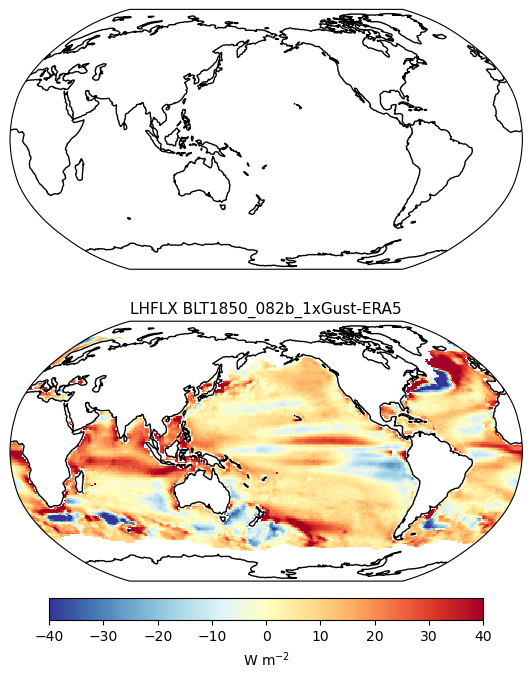

In [24]:
# - - - - - - - - - - - - - -  
# Biases from ERA5
# - - - - - - - - - - - - - -

varSel   = 'LHFLX'
varMult = 1
var_norm = mpl.colors.Normalize(vmin=-40, vmax=40)
cmapSel  = 'RdYlBu_r'
unitsStr = 'W m$^{-2}$'
obsDS    = regridERA5_ANN
obsVar   = 'slhf'

# varSel   = 'U10'
# varMult = 1
# var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
# cmapSel  = 'seismic'
# unitsStr = 'm/s'
# obsDS    = regridERA5_ANN
# obsVar   = 'U10'


# varSel   = 'PRECT'
# varMult = 86400*1e3
# var_norm = mpl.colors.Normalize(vmin=-5, vmax=5)
# cmapSel  = 'seismic'
# unitsStr = 'mm d$^{-1}$'
# obsDS    = regridERA5_ANN
# obsVar   = 'tp'


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(8,9), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
fig, ax = plt.subplots(nrows=2, figsize=(8,9), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
# for iInd in range(len(all_h0.case.values)):
for iInd in range(2):

    if ( (iInd==1) | (iInd==3)):
    
        img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                                   fillOcnFrac_h0_mean*( (varMult*all_h0[varSel].isel(case=iInd).mean(dim='time').values) - obsDS[obsVar].values), 
                                   transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
        if iInd==0:
            ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'-ERA5\nAnnMean', fontsize=11)
        else:
            ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=iInd).case.values)+'-ERA5', fontsize=11)
    
[a.coastlines() for a in ax]
# [a.set_extent([np.nanmin(h0_LP['lon'].values),np.nanmax(h0_LP['lon'].values),-20,20]) for a in ax]
# [a.set_extent([1,358,-25,25],crs=ccrs.PlateCarree()) for a in ax]   ## Tropics
[a.set_extent([1,358,-80,80],crs=ccrs.PlateCarree()) for a in ax]   ## Tropics

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.7, label=unitsStr, orientation='horizontal', pad=0.025) 


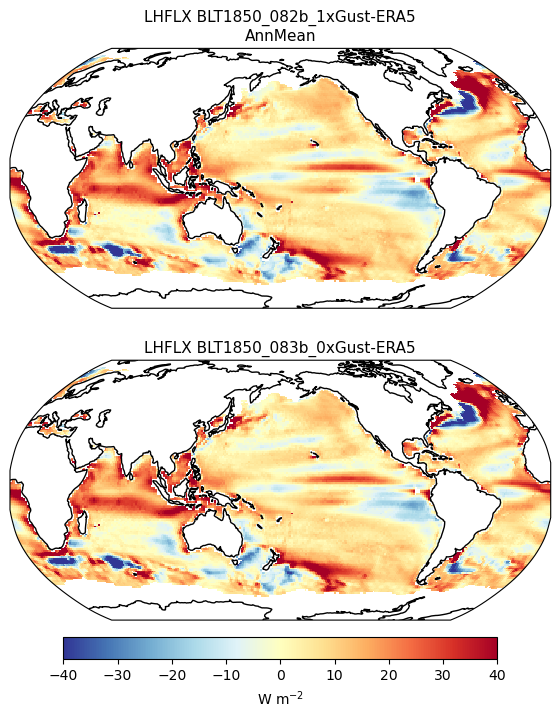

In [25]:
# - - - - - - - - - - - - - -  
# Biases from ERA5
# - - - - - - - - - - - - - -

varSel   = 'LHFLX'
varMult = 1
var_norm = mpl.colors.Normalize(vmin=-40, vmax=40)
cmapSel  = 'RdYlBu_r'
unitsStr = 'W m$^{-2}$'
obsDS    = regridERA5_ANN
obsVar   = 'slhf'

# varSel   = 'U10'
# varMult = 1
# var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
# cmapSel  = 'seismic'
# unitsStr = 'm/s'
# obsDS    = regridERA5_ANN
# obsVar   = 'U10'


# varSel   = 'PRECT'
# varMult = 86400*1e3
# var_norm = mpl.colors.Normalize(vmin=-5, vmax=5)
# cmapSel  = 'seismic'
# unitsStr = 'mm d$^{-1}$'
# obsDS    = regridERA5_ANN
# obsVar   = 'tp'


# Shamelessly stealing plot code from Brian's python pointers notebook (vol 4) 
# fig, ax = plt.subplots(nrows=len(all_h0.case.values), figsize=(8,9), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
fig, ax = plt.subplots(nrows=2, figsize=(8,9), subplot_kw={"projection":ccrs.Robinson(central_longitude=180)})
# for iInd in range(len(all_h0.case.values)):
caseSel = [1,3]
for iInd in range(2):
    
        img1 = ax[iInd].pcolormesh(longrid, latgrid, 
                                   fillOcnFrac_h0_mean*( (varMult*all_h0[varSel].isel(case=caseSel[iInd]).mean(dim='time').values) - obsDS[obsVar].values), 
                                   transform=ccrs.PlateCarree(), norm=var_norm, cmap=cmapSel) 
        if iInd==0:
            ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=caseSel[iInd]).case.values)+'-ERA5\nAnnMean', fontsize=11)
        else:
            ax[iInd].set_title(varSel+' '+str(all_h0[varSel].isel(case=caseSel[iInd]).case.values)+'-ERA5', fontsize=11)
    
[a.coastlines() for a in ax]
# [a.set_extent([np.nanmin(h0_LP['lon'].values),np.nanmax(h0_LP['lon'].values),-20,20]) for a in ax]
# [a.set_extent([1,358,-25,25],crs=ccrs.PlateCarree()) for a in ax]   ## Tropics
[a.set_extent([1,358,-80,80],crs=ccrs.PlateCarree()) for a in ax]   ## Tropics

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap=cmapSel), ax=ax, shrink=0.7, label=unitsStr, orientation='horizontal', pad=0.025) 


### How about some distributions?


In [26]:
# ## Also create ocean-only frac
# fillOcnFrac_h0= np.full([2, len(all_h0.lat.values), len(all_h0.lon.values)], np.nan)
# fillOcnFrac_h0[:,:,:] = all_h0.OCNFRAC.isel(case=0, time=0)
# fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan
# ## Get means 
# fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]
# ## Also create ocean-only frac with time dimension
# fillOcnFrac_h0_allTimes= np.full([len(all_h0.time.values), len(all_h0.lat.values), len(all_h0.lon.values)], np.nan)
# fillOcnFrac_h0_allTimes[:,:,:] = all_h0.OCNFRAC.isel(case=0)
# fillOcnFrac_h0_allTimes[np.where(fillOcnFrac_h0_allTimes!=1)] = np.nan


In [35]:
# ## Read in ERA-5 Monthly means for the same period 
# filePath = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_fluxesAndRain.nc'
# era5_obs = xr.open_dataset(filePath, decode_times=True)

# ## Add neutral 10m wind components 
# fileNeut = '/glade/work/mdfowler/obs/ERA5_monthlyAvg_1995to2014_neutral10mWinds.nc'
# era5_neut = xr.open_dataset(fileNeut, decode_times=True)
# era5_obs = xr.merge([era5_obs, era5_neut])

# era5_obs = era5_obs.reindex(latitude=era5_obs.latitude[::-1])
# era5_obs = era5_obs.rename_dims(dims_dict={'latitude':'lat', 'longitude':'lon'})
# era5_obs = era5_obs.rename(name_dict={'latitude':'lat', 'longitude':'lon'})

# # Now regrid the data
# # Get model grid 
# camGrid = all_h0['LHFLX'].isel(time=0,case=0).load().squeeze()

# # lhflx_era5 = era5_obs['slhf'].where(era5_obs['slhf'].values>-999)
# lhflx_era5 = -era5_obs['slhf']/86400  # Divide fluxes by 86400 to get from J/m2 to W/m2; Add negative sign to match CAM convention 
# regridERA5_lhflx = regrid_data(lhflx_era5, camGrid, method=1)

# ## NOW: use neutral winds for 10m u and v 
# era5_u10_temp = era5_obs['u10n']
# era5_v10_temp = era5_obs['v10n']
# u10_era5 = np.sqrt(era5_u10_temp**2 + era5_v10_temp**2)
# regridERA5_u10 = regrid_data(u10_era5, camGrid, method=1)

# era5_prect_temp  = era5_obs['tp']
# era5_prect_temp  =  era5_prect_temp * 1000.0  # Convert from m of water per day to mm/day
# regridERA5_prect = regrid_data(era5_prect_temp, camGrid, method=1)

# ## Combine back into one xarray dataset
# regridERA5 = regridERA5_lhflx.to_dataset()
# regridERA5['U10'] = (('time','lat','lon'), regridERA5_u10.values)
# regridERA5['tp'] = (('time','lat','lon'), regridERA5_prect.values)
# # regridERA5 = xr.merge([regridERA5_lhflx, regridERA5_u10, regridERA5_prect])

# ## Select certain seasons and average over those 
# iTimes_DJF = np.where( (regridERA5['time.month']==12) | (regridERA5['time.month']<=2) )[0]
# iTimes_JJA = np.where( (regridERA5['time.month']>=6) &  (regridERA5['time.month']<=8) )[0]
# iTimes_MAM = np.where( (regridERA5['time.month']>=3) &  (regridERA5['time.month']<=5) )[0]
# iTimes_SON = np.where( (regridERA5['time.month']>=9) &  (regridERA5['time.month']<=11) )[0]

# regridERA5_DJF = regridERA5.isel(time=iTimes_DJF).mean(dim='time')
# regridERA5_JJA = regridERA5.isel(time=iTimes_JJA).mean(dim='time')
# regridERA5_MAM = regridERA5.isel(time=iTimes_MAM).mean(dim='time')
# regridERA5_SON = regridERA5.isel(time=iTimes_SON).mean(dim='time')
# regridERA5_ANN = regridERA5.mean(dim='time')

# era5_DJF_allTimes = regridERA5.isel(time=iTimes_DJF)


In [63]:
# ## DJF IO across cases 
# iTimes_DJF  = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
# ilats = np.where( (all_h0.lat.values>=-15) & (all_h0.lat.values<=15) )[0]
# ilons = np.where( (all_h0.lon.values>=40) & (all_h0.lon.values<=105) )[0]

# all_h0_DJF_IO   = all_h0.isel(time=iTimes_DJF, lat=ilats, lon=ilons)

# fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean[ilats,:]
# fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean_IO[:, ilons]

# # ctrl_h1_djf  = h1_drchFix.isel(case=0,   time=iTimes_DJF).mean(dim='time')
# # fix_h1_djf   = h1_drchFix.isel(case=1,   time=iTimes_DJF).mean(dim='time')
# # x3fix_h1_djf = h1_drchFix.isel(case=2,   time=iTimes_DJF).mean(dim='time')
# # noFix_h1_djf = h1_drchNoFix.isel(case=1, time=iTimes2_DJF).mean(dim='time') 


# # ERA5 in IO 
# era5_DJF_IO = regridERA5_DJF.isel(lat=ilats, lon=ilons)


In [91]:
## DJF TROPICS across cases  
iTimes_DJF  = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
ilats = np.where( (all_h0.lat.values>=-15) & (all_h0.lat.values<=15) )[0]
# ilons = np.where( (all_h0.lon.values>=40) & (all_h0.lon.values<=105) )[0]

all_h0_DJF_IO   = all_h0.isel(time=iTimes_DJF, lat=ilats)

fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean[ilats,:]
# fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean_IO[:, ilons]

# ctrl_h1_djf  = h1_drchFix.isel(case=0,   time=iTimes_DJF).mean(dim='time')
# fix_h1_djf   = h1_drchFix.isel(case=1,   time=iTimes_DJF).mean(dim='time')
# x3fix_h1_djf = h1_drchFix.isel(case=2,   time=iTimes_DJF).mean(dim='time')
# noFix_h1_djf = h1_drchNoFix.isel(case=1, time=iTimes2_DJF).mean(dim='time') 


# ERA5 in IO 
era5_DJF_IO = regridERA5_DJF.isel(lat=ilats)


In [92]:
nTimes = len(all_h0_DJF_IO.time.values)
nLat = len(all_h0_DJF_IO.lat.values)
nLon = len(all_h0_DJF_IO.lon.values)
ocnFrac_withTime = np.full([nTimes, nLat, nLon], np.nan)
for iT in range(nTimes):
    ocnFrac_withTime[iT,:,:] = fillOcnFrac_h0_mean_IO


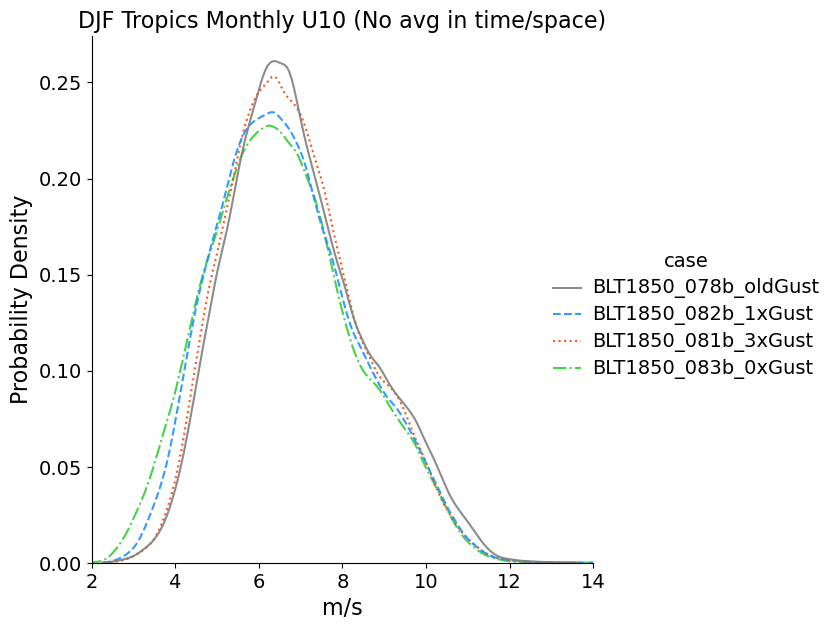

In [94]:
numEl = nTimes*nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'U10'
obsVar = 'U10'
unitsString = 'm/s'

flat_ctrlDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=0).values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=1).values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=2).values).reshape(numEl,1) )
flat_0fixDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=3).values).reshape(numEl,1) )

# flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['gray','dodgerblue','orangered','limegreen'],
                 )

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# g.ax.set_title('DJF IO Monthly ' +varName+' (No avg in time/space)',fontsize=16)
g.ax.set_title('DJF Tropics Monthly ' +varName+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([2,14])

lss = ['-.',':','--','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)



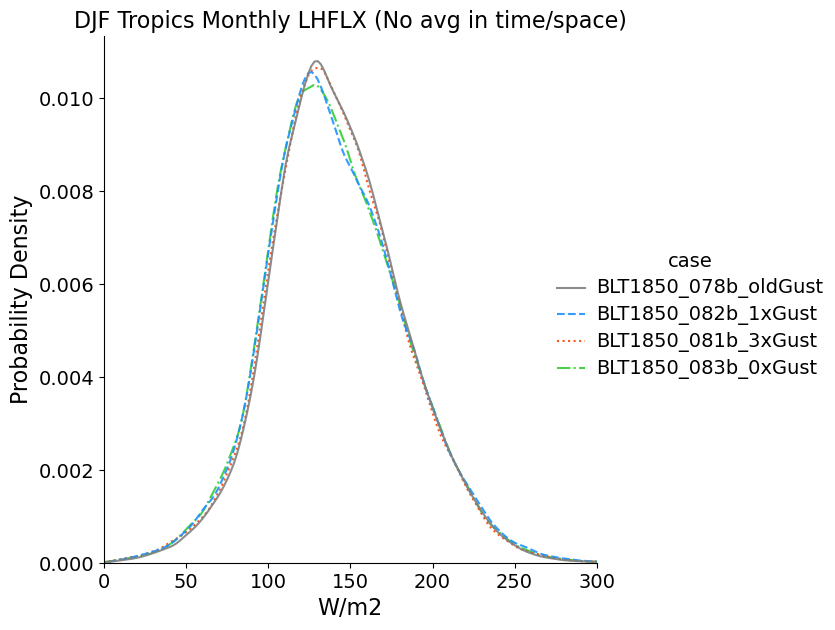

In [98]:
numEl = nTimes*nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'LHFLX'
obsVar = 'slhf'
unitsString = 'W/m2'

flat_ctrlDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=0).values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=1).values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=2).values).reshape(numEl,1) )
flat_0fixDJF  = np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=3).values).reshape(numEl,1) )

# flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['gray','dodgerblue','orangered','limegreen'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# g.ax.set_title('DJF IO Monthly ' +varName+' (No avg in time/space)',fontsize=16)
g.ax.set_title('DJF Tropics Monthly ' +varName+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([0,300])

lss = ['-.',':','--','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)



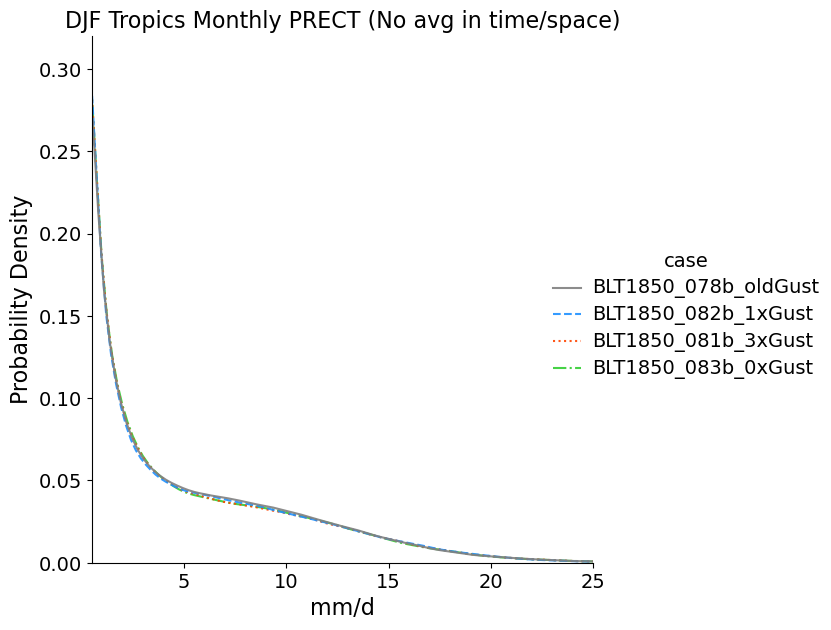

In [97]:
numEl = nTimes*nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'PRECT'
obsVar = 'tp'
unitsString = 'mm/d'
varMult = 86400*1e3

flat_ctrlDJF  = varMult*np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=0).values).reshape(numEl,1) )
flat_1fixDJF  = varMult*np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=1).values).reshape(numEl,1) )
flat_3fixDJF  = varMult*np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=2).values).reshape(numEl,1) )
flat_0fixDJF  = varMult*np.squeeze( (ocnFrac_withTime*all_h0_DJF_IO[varName].isel(case=3).values).reshape(numEl,1) )

# flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['gray','dodgerblue','orangered', 'limegreen'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
# g.ax.set_title('DJF IO Monthly ' +varName+' (No avg in time/space)',fontsize=16)
g.ax.set_title('DJF Tropics Monthly ' +varName+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([0.5, 25])

lss = ['-.',':','--','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)


In [88]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = all_h0_DJF_IO.PRECT * valueMultiplier
ocnRain = rain_newUnits * ocnFrac_withTime
ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)*len(ocnRain.time.values)


In [87]:
# bins = np.logspace(-2, 2, num=40)
bins = np.logspace(-1.6, 2, num=81)

counts      = np.full([len(all_h0_DJF_IO.case.values), len(bins)-1], np.nan)
binRate     = np.full([len(all_h0_DJF_IO.case.values), len(bins)-1], np.nan)

for iCase in range(len(all_h0_DJF_IO.case.values)):
    caseRain = np.squeeze(ocnRain.isel(case=iCase).values.reshape(numEl,1))
    
    for iBin in range(len(bins)-1): 
        vals     = np.where((caseRain>=bins[iBin]) & (caseRain<bins[iBin+1]))[0]
        
        if len(vals)>0:
            counts[iCase, iBin] = len(vals)
        else: 
            counts[iCase, iBin] = 0
            
        binRate[iCase, iBin] = np.mean([bins[iBin], bins[iBin+1]])


(2.0, 45.0)

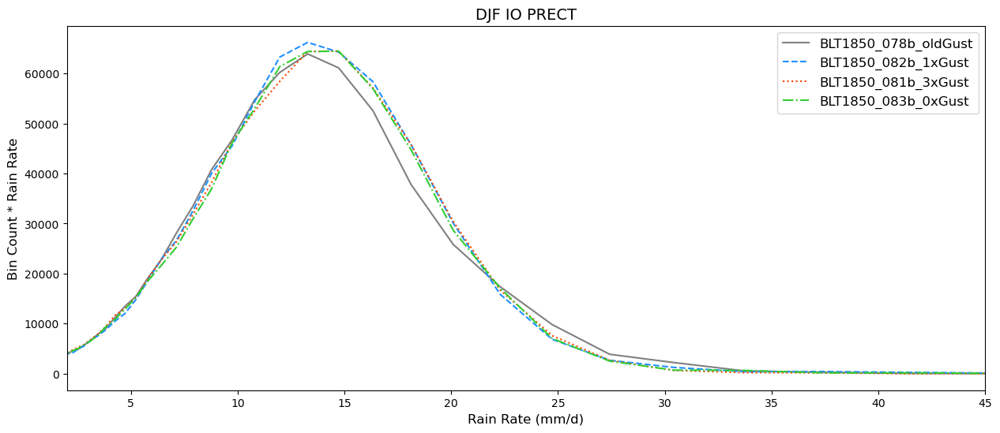

In [89]:
fig,axs = plt.subplots(1,1, figsize=(15,6) )
# palette=[ 'gray','dodgerblue','orangered','limegreen'])

lss = ['-.',':','--','-']

axs.plot(binRate[0,:], binRate[0,:]*counts[0,:], '-',color='grey',   label=all_h0_DJF_IO.case.values[0])
axs.plot(binRate[1,:], binRate[1,:]*counts[1,:], '--', color='dodgerblue', label=all_h0_DJF_IO.case.values[1])
axs.plot(binRate[2,:], binRate[2,:]*counts[2,:], ':', color='orangered', label=all_h0_DJF_IO.case.values[2])
axs.plot(binRate[3,:], binRate[3,:]*counts[3,:], '-.', color='limegreen', label=all_h0_DJF_IO.case.values[3])

axs.legend(fontsize=12)
axs.set_xlabel('Rain Rate (mm/d)',fontsize=12)
axs.set_ylabel('Bin Count * Rain Rate',fontsize=12)
axs.set_title('DJF IO PRECT',fontsize=14)
# axs.set_xscale('log')

axs.set_xlim([2,45])

The plots below average CESM in time so that they can be plotted reasonably against ERA5 (which is a seasonal average) 

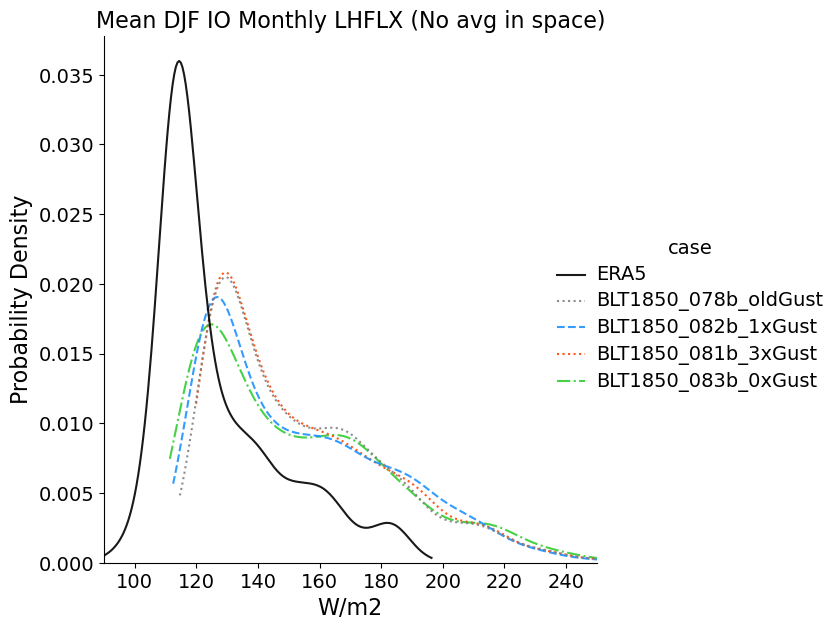

In [32]:
numEl = nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'LHFLX'
obsVar = 'slhf'
unitsString = 'W/m2'

flat_ctrlDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=0).mean(dim='time').values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=1).mean(dim='time').values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=2).mean(dim='time').values).reshape(numEl,1) )
flat_0fixDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=3).mean(dim='time').values).reshape(numEl,1) )

flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['black', 'gray','dodgerblue','orangered','limegreen'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('Mean DJF IO Monthly ' +varName+' (No avg in space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([90,250])

lss = ['-.',':','--',':','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)
    

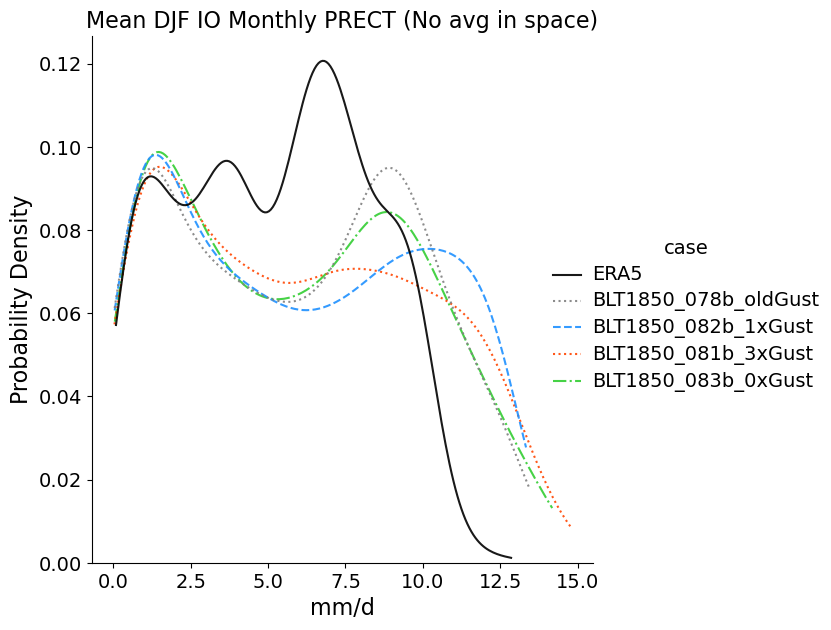

In [35]:
numEl = nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'PRECT'
obsVar = 'tp'
unitsString = 'mm/d'
varMult = 86400*1e3

flat_ctrlDJF  = np.squeeze( varMult*(fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=0).mean(dim='time').values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( varMult*(fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=1).mean(dim='time').values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( varMult*(fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=2).mean(dim='time').values).reshape(numEl,1) )
flat_0fixDJF  = np.squeeze( varMult*(fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=3).mean(dim='time').values).reshape(numEl,1) )

flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['Trueblack','gray','orangered','blue','darkorange'])
                 palette=['black', 'gray','dodgerblue','orangered','limegreen'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('Mean DJF IO Monthly ' +varName+' (No avg in space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

# g.ax.set_xlim([1e-1,18])

lss = ['-.',':','--',':','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)


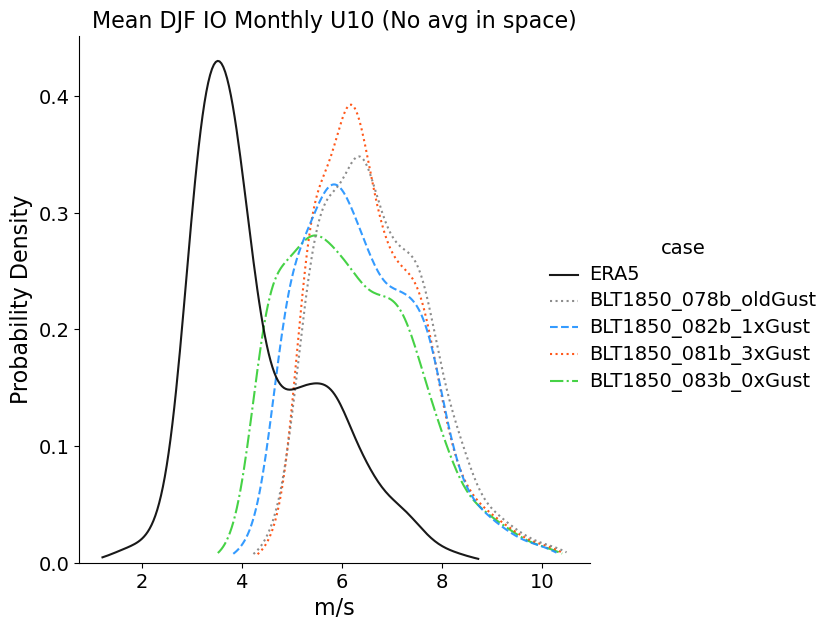

In [36]:
numEl = nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'U10'
obsVar = 'U10'
unitsString = 'm/s'

flat_ctrlDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=0).mean(dim='time').values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=1).mean(dim='time').values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=2).mean(dim='time').values).reshape(numEl,1) )
flat_0fixDJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*all_h0_DJF_IO[varName].isel(case=3).mean(dim='time').values).reshape(numEl,1) )

flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h0_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h0_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h0_DJF_IO.isel(case=2).case.values)}),
         pd.DataFrame.from_dict({varName: flat_0fixDJF, 'case': str(all_h0_DJF_IO.isel(case=3).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['black', 'gray','dodgerblue','orangered','limegreen'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('Mean DJF IO Monthly ' +varName+' (No avg in space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

# g.ax.set_xlim([90,250])

lss = ['-.',':','--',':','-']
axes = g.axes.flat
for ax in axes:
    for line, ls in zip(ax.lines, lss):
        line.set_linestyle(ls)
handles = g._legend.legendHandles[::-1]
for handle, ls in zip(handles, lss):
    handle.set_ls(ls)
    

**How much does each bin contribute to total?**

In [80]:
valueMultiplier = (24*3600*1e3)
unitsString = 'mm/day'

rain_newUnits = all_h0_DJF_IO.PRECT.mean(dim='time') * valueMultiplier
ocnRain = rain_newUnits * fillOcnFrac_h0_mean_IO
ocnRain = ocnRain.where(ocnRain>0.029)

numEl = len(ocnRain.lat.values)*len(ocnRain.lon.values)


In [82]:
# bins = np.logspace(-2, 2, num=40)
bins = np.logspace(-1.6, 2, num=81)

counts      = np.full([len(all_h0_DJF_IO.case.values), len(bins)-1], np.nan)
binRate     = np.full([len(all_h0_DJF_IO.case.values), len(bins)-1], np.nan)
counts_era      = np.full([len(bins)-1], np.nan)

for iCase in range(len(all_h0_DJF_IO.case.values)):
    caseRain = np.squeeze(ocnRain.isel(case=iCase).values.reshape(numEl,1))
    caseRain_ERA = np.squeeze(era5_DJF_IO['tp'].values.reshape(numEl,1))
    
    for iBin in range(len(bins)-1): 
        vals     = np.where((caseRain>=bins[iBin]) & (caseRain<bins[iBin+1]))[0]
        if len(vals)>0:
            counts[iCase, iBin] = len(vals)
        else: 
            counts[iCase, iBin] = 0

        ## ERA5 
        vals     = np.where((caseRain_ERA>=bins[iBin]) & (caseRain_ERA<bins[iBin+1]))[0]
        if len(vals)>0:
            counts_era[iBin] = len(vals)
        else: 
            counts_era[iBin] = 0
            
        binRate[iCase, iBin] = np.mean([bins[iBin], bins[iBin+1]])


(0.5, 20.0)

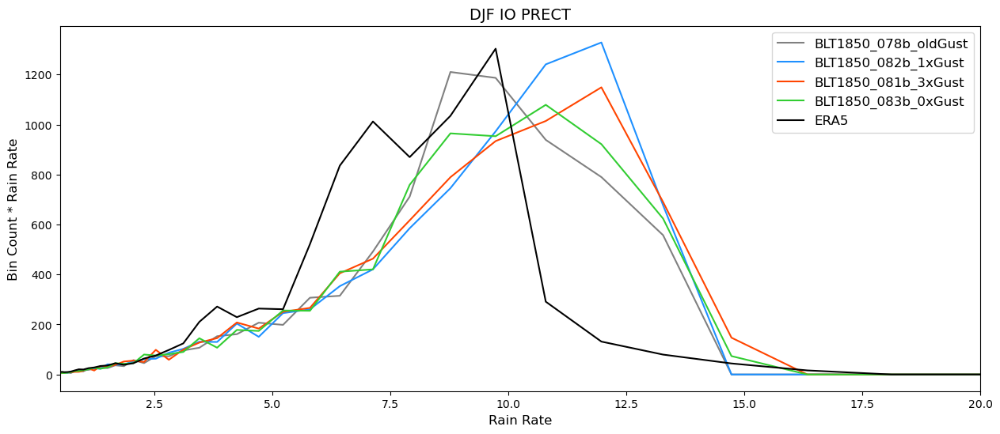

In [83]:
fig,axs = plt.subplots(1,1, figsize=(15,6) )
# palette=[ 'gray','dodgerblue','orangered','limegreen'])


axs.plot(binRate[0,:], binRate[0,:]*counts[0,:], color='grey',   label=all_h0_DJF_IO.case.values[0])
axs.plot(binRate[1,:], binRate[1,:]*counts[1,:], color='dodgerblue', label=all_h0_DJF_IO.case.values[1])
axs.plot(binRate[2,:], binRate[2,:]*counts[2,:], color='orangered', label=all_h0_DJF_IO.case.values[2])
axs.plot(binRate[3,:], binRate[3,:]*counts[3,:], color='limegreen', label=all_h0_DJF_IO.case.values[3])
axs.plot(binRate[3,:], binRate[3,:]*counts_era[:], color='k', label='ERA5')

axs.legend(fontsize=12)
axs.set_xlabel('Rain Rate',fontsize=12)
axs.set_ylabel('Bin Count * Rain Rate',fontsize=12)
axs.set_title('DJF IO PRECT',fontsize=14)
# axs.set_xscale('log')

axs.set_xlim([0.5,20])

## Use daily?

In [33]:
## DJF IO across cases (based on daily data) 
iTimes_DJF  = np.where( (all_h1['time.month']==12) | (all_h1['time.month']<=2) )[0]
ilats = np.where( (all_h1.lat.values>=-15) & (all_h1.lat.values<=15) )[0]
ilons = np.where( (all_h1.lon.values>=40) & (all_h1.lon.values<=105) )[0]

all_h1_DJF_IO   = all_h1.isel(time=iTimes_DJF, lat=ilats, lon=ilons)

fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean[ilats,:]
fillOcnFrac_h0_mean_IO = fillOcnFrac_h0_mean_IO[:, ilons]



In [34]:
nTimes = len(all_h1_DJF_IO.time.values)
nLat = len(all_h1_DJF_IO.lat.values)
nLon = len(all_h1_DJF_IO.lon.values)
ocnFrac_withTime = np.full([nTimes, nLat, nLon], np.nan)
for iT in range(nTimes):
    ocnFrac_withTime[iT,:,:] = fillOcnFrac_h0_mean_IO


(-20.0, 20.0)

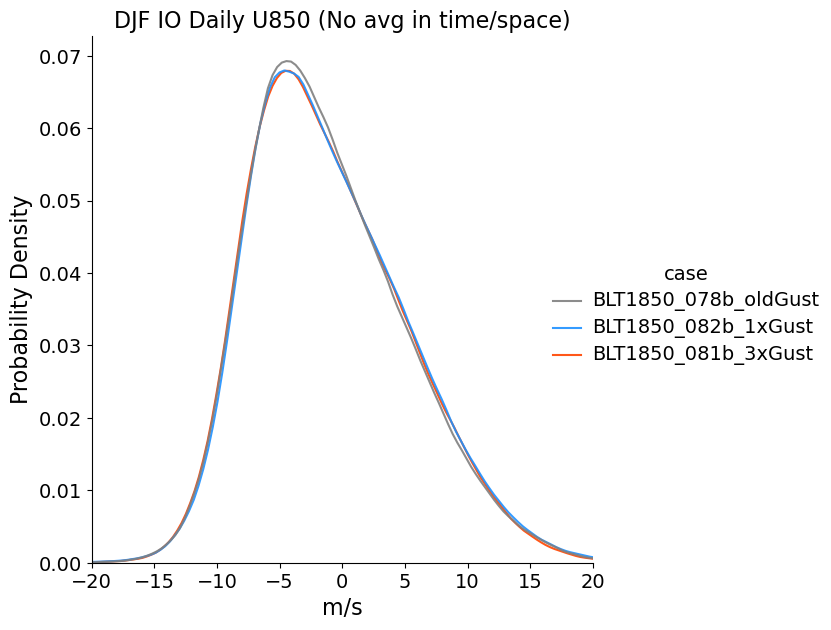

In [40]:
numEl = nTimes*nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'U850'
obsVar = 'U850'
unitsString = 'm/s'

flat_ctrlDJF  = np.squeeze( (ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=0).values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( (ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=1).values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( (ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=2).values).reshape(numEl,1) )

# flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF, 'case': str(all_h1_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF, 'case': str(all_h1_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF, 'case': str(all_h1_DJF_IO.isel(case=2).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=False, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['gray','dodgerblue','orangered'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('DJF IO Daily ' +varName+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([-20,20])


(1e-07, 100.0)

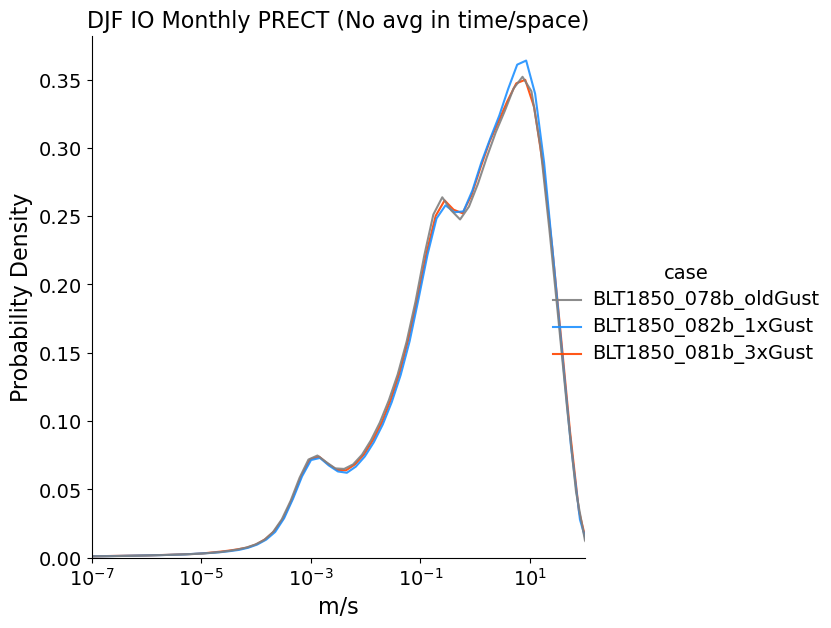

In [43]:
numEl = nTimes*nLat*nLon 
numEl_era5 = nLat*nLon 

varName = 'PRECT'
obsVar = 'tp'
varMult = 86400*1e3
unitsString = 'm/s'

flat_ctrlDJF  = np.squeeze( varMult*(ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=0).values).reshape(numEl,1) )
flat_1fixDJF   = np.squeeze( varMult*(ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=1).values).reshape(numEl,1) )
flat_3fixDJF  = np.squeeze( varMult*(ocnFrac_withTime*all_h1_DJF_IO[varName].isel(case=2).values).reshape(numEl,1) )

# flat_era5DJF  = np.squeeze( (fillOcnFrac_h0_mean_IO*era5_DJF_IO[obsVar].values).reshape(numEl_era5,1) )


dfReal = pd.concat(axis=0, ignore_index=True, objs=[
         # pd.DataFrame.from_dict({varName: flat_era5DJF, 'case': 'ERA5'}),
         pd.DataFrame.from_dict({varName: flat_ctrlDJF[np.where(flat_ctrlDJF>0)[0]], 'case': str(all_h1_DJF_IO.isel(case=0).case.values)}),
         pd.DataFrame.from_dict({varName: flat_1fixDJF[np.where(flat_1fixDJF>0)[0]], 'case': str(all_h1_DJF_IO.isel(case=1).case.values)}),
         pd.DataFrame.from_dict({varName: flat_3fixDJF[np.where(flat_3fixDJF>0)[0]], 'case': str(all_h1_DJF_IO.isel(case=2).case.values)}),
         ])

# Make plot 
g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                log_scale=True, common_norm = False, alpha=0.9,
                 # palette=['black','gray','orangered','blue','darkorange'])
                 palette=['gray','dodgerblue','orangered'])

g.ax.set_xlabel(unitsString,fontsize=16)
g.ax.set_ylabel('Probability Density',fontsize=16)
g.ax.tick_params(axis='both', labelsize= 14)
g.ax.set_title('DJF IO Monthly ' +varName+' (No avg in time/space)',fontsize=16)
plt.setp(g._legend.get_title(), fontsize=14)
plt.setp(g._legend.get_texts(), fontsize=14)

g.ax.set_xlim([1e-7,1e2])


## Take a look at Summer monsoon?

In [104]:
iTimes_JJA  = np.where( (all_h1['time.month']>=6) | (all_h1['time.month']<=10) )[0]
ilats = np.where( (all_h1.lat.values>=0) & (all_h1.lat.values<=60) )[0]
ilons = np.where( (all_h1.lon.values>=40) & (all_h1.lon.values<=180) )[0]

all_h1_summer   = all_h1.isel(time=iTimes_JJA, lat=ilats, lon=ilons)

fillOcnFrac_h0_mean_reg = fillOcnFrac_h0_mean[ilats,:]
fillOcnFrac_h0_mean_reg = fillOcnFrac_h0_mean_reg[:, ilons]



In [106]:
# Group by day of the year and calculate the mean
daily_mean = all_h1_summer.groupby('time.dayofyear').mean(dim='time')


In [118]:
monsoonTimes = daily_mean.sel(dayofyear=np.arange(152,273))

meanMonsoonTime = monsoonTimes.mean(dim='dayofyear')
monsoonAnomalies = monsoonTimes - meanMonsoonTime

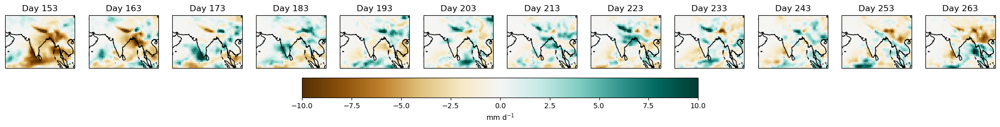

In [164]:
timePlot = np.arange(1,121, 10)
longrid, latgrid = np.meshgrid(monsoonAnomalies['lon'], monsoonAnomalies['lat'])

varSel  = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-10, vmax=10)
varMult = 86400*1e3
caseSel = 0

varAnomalies = varMult * monsoonAnomalies[varSel].isel(case=caseSel)

fig, ax = plt.subplots(ncols = len(timePlot), figsize=(25,10), subplot_kw={"projection":ccrs.Robinson()})

for iDay in range(len(timePlot)):
    img1 = ax[iDay].pcolormesh(longrid, latgrid, 
                               varAnomalies.isel(dayofyear=timePlot[iDay]).values, 
                               transform=ccrs.PlateCarree(), norm=var_norm, cmap='BrBG') 
    ax[iDay].set_title('Day '+str(varAnomalies.dayofyear.values[timePlot[iDay]]))

[a.coastlines() for a in ax]
[a.set_extent([55,110,0,40], crs=ccrs.PlateCarree()) for a in ax]

cb = fig.colorbar(mpl.cm.ScalarMappable(norm=var_norm, cmap='BrBG'), ax=ax, shrink=0.4, label=unitsStr, orientation='horizontal', pad=0.025) 



Text(0.5, 1.0, 'PRECT Anomalies (June 1-Sept 30)\nBLT1850_078b_oldGust')

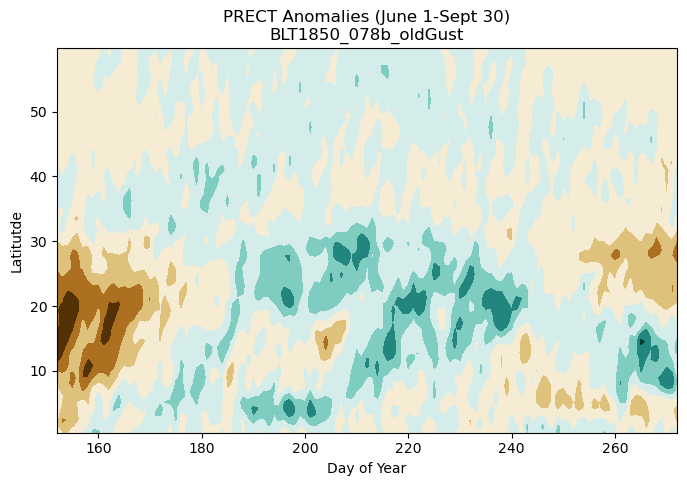

In [162]:
varSel  = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
caseSel = 0

varAnomalies = varMult * monsoonAnomalies[varSel].isel(case=caseSel)
fig,axs = plt.subplots(1,1,figsize=(8,5))
# axs.contourf(varAnomalies.lat.values, varAnomalies.dayofyear.values, varAnomalies.mean(dim='lon'),
axs.contourf(varAnomalies.dayofyear.values, varAnomalies.lat.values, varAnomalies.mean(dim='lon').transpose(),
             norm=var_norm, cmap='BrBG',extend='both')
# axs.set_xlabel('Latitutde')
# axs.set_ylabel('Day of Year')
axs.set_ylabel('Latitutde')
axs.set_xlabel('Day of Year')
axs.set_title('PRECT Anomalies (June 1-Sept 30)\n' + str(monsoonAnomalies.isel(case=caseSel).case.values))


Text(0.5, 1.0, 'PRECT Anomalies (June 1-Sept 30)\nBLT1850_082b_1xGust')

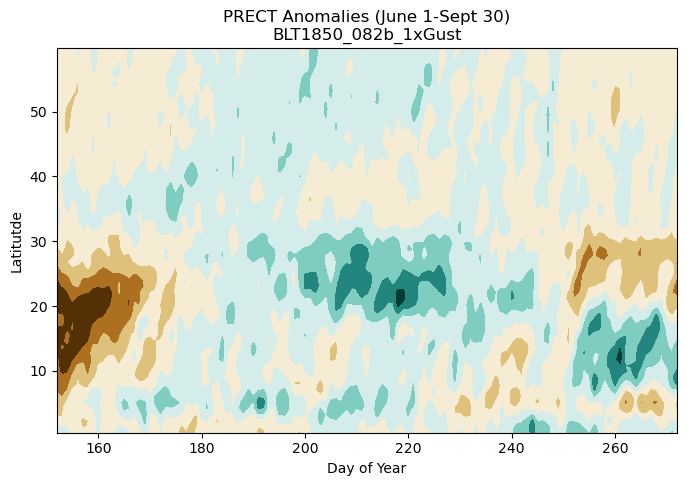

In [165]:
varSel  = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
caseSel = 1

varAnomalies = varMult * monsoonAnomalies[varSel].isel(case=caseSel)
fig,axs = plt.subplots(1,1,figsize=(8,5))
# axs.contourf(varAnomalies.lat.values, varAnomalies.dayofyear.values, varAnomalies.mean(dim='lon'),
axs.contourf(varAnomalies.dayofyear.values, varAnomalies.lat.values, varAnomalies.mean(dim='lon').transpose(),
             norm=var_norm, cmap='BrBG',extend='both')
# axs.set_xlabel('Latitutde')
# axs.set_ylabel('Day of Year')
axs.set_ylabel('Latitutde')
axs.set_xlabel('Day of Year')
axs.set_title('PRECT Anomalies (June 1-Sept 30)\n' + str(monsoonAnomalies.isel(case=caseSel).case.values))


Text(0.5, 1.0, 'PRECT Anomalies (June 1-Sept 30)\nBLT1850_081b_3xGust')

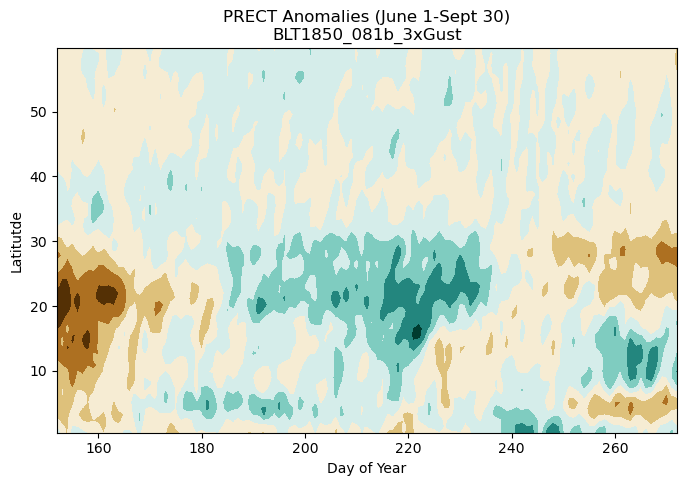

In [166]:
varSel  = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
caseSel = 2

varAnomalies = varMult * monsoonAnomalies[varSel].isel(case=caseSel)
fig,axs = plt.subplots(1,1,figsize=(8,5))
# axs.contourf(varAnomalies.lat.values, varAnomalies.dayofyear.values, varAnomalies.mean(dim='lon'),
axs.contourf(varAnomalies.dayofyear.values, varAnomalies.lat.values, varAnomalies.mean(dim='lon').transpose(),
             norm=var_norm, cmap='BrBG',extend='both')
# axs.set_xlabel('Latitutde')
# axs.set_ylabel('Day of Year')
axs.set_ylabel('Latitutde')
axs.set_xlabel('Day of Year')
axs.set_title('PRECT Anomalies (June 1-Sept 30)\n' + str(monsoonAnomalies.isel(case=caseSel).case.values))


Text(0.5, 1.0, 'PRECT Anomalies (June 1-Sept 30)\nBLT1850_083b_0xGust')

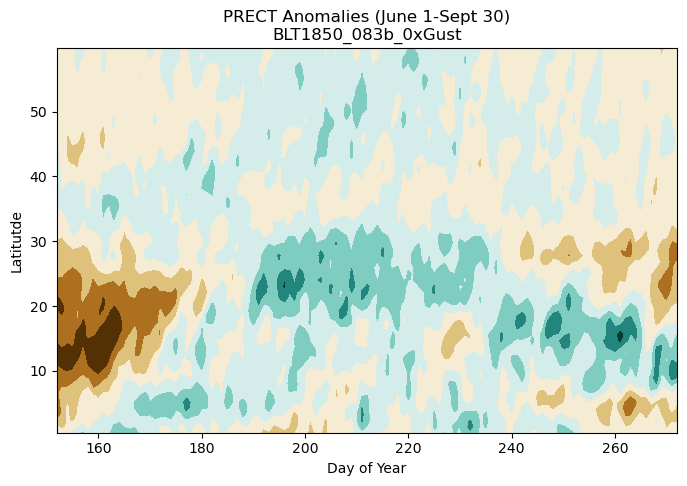

In [167]:
varSel  = 'PRECT'
var_norm = mpl.colors.Normalize(vmin=-3, vmax=3)
varMult = 86400*1e3
caseSel = 3

varAnomalies = varMult * monsoonAnomalies[varSel].isel(case=caseSel)
fig,axs = plt.subplots(1,1,figsize=(8,5))
# axs.contourf(varAnomalies.lat.values, varAnomalies.dayofyear.values, varAnomalies.mean(dim='lon'),
axs.contourf(varAnomalies.dayofyear.values, varAnomalies.lat.values, varAnomalies.mean(dim='lon').transpose(),
             norm=var_norm, cmap='BrBG',extend='both')
# axs.set_xlabel('Latitutde')
# axs.set_ylabel('Day of Year')
axs.set_ylabel('Latitutde')
axs.set_xlabel('Day of Year')
axs.set_title('PRECT Anomalies (June 1-Sept 30)\n' + str(monsoonAnomalies.isel(case=caseSel).case.values))


In [168]:
## Compare to ERA5?
fileName = '/glade/work/rneale/data/ERA5/PRECT.day.mean.leap.nc'
era5_daily = xr.open_dataset(fileName, decode_times=True)

## Select same set of years 
iYears = np.where((era5_daily['time.year']>=1996) & (era5_daily['time.year']<=2014))[0]

era5_prect_temp  =  era5_daily['tp'].isel(time=iYears)
era5_prect_temp  =  era5_prect_temp * 1000.0 # Convert from m of water per day to mm/day
regridERA5_prectDaily =  regrid_data(era5_prect_temp, camGrid, method=1)


In [169]:
daily_era5 = regridERA5_prectDaily.isel(lat=ilats, lon=ilons).groupby('time.dayofyear').mean(dim='time')

In [ ]:
daily_era5

In [182]:
monsoonTimes = daily_era5.sel(dayofyear=np.arange(152,273))

meanMonsoonTime = monsoonTimes.mean(dim='dayofyear')
monsoonAnomalies = monsoonTimes - meanMonsoonTime

In [180]:
era5_prect_temp

<xarray.DataArray 'tp' (time: 6575, lat: 180, lon: 360)>
array([[[ 5.3029507e-02,  5.3029507e-02,  5.3029507e-02, ...,
          5.4389238e-02,  5.4389238e-02,  5.4389238e-02],
        [ 2.3111701e-02,  2.3111701e-02,  2.3111701e-02, ...,
          2.3111701e-02,  2.3111701e-02,  2.3111701e-02],
        [ 5.4351985e-03,  6.7949295e-03,  6.7949295e-03, ...,
          5.4351985e-03,  5.4351985e-03,  5.4351985e-03],
        ...,
        [ 4.0754676e-03,  4.0754676e-03,  4.0754676e-03, ...,
          4.0754676e-03,  4.0754676e-03,  4.0754676e-03],
        [ 1.3560057e-03,  1.3560057e-03,  1.3560057e-03, ...,
          1.3560057e-03,  1.3560057e-03,  1.3560057e-03],
        [ 1.3560057e-03,  1.3560057e-03,  1.3560057e-03, ...,
          1.3560057e-03,  1.3560057e-03,  1.3560057e-03]],

       [[ 4.4871122e-02,  4.4871122e-02,  4.6230853e-02, ...,
          4.4871122e-02,  4.4871122e-02,  4.4871122e-02],
        [ 2.8550625e-02,  2.8550625e-02,  2.8550625e-02, ...,
          2.8550625e-02,  2.8550625e-02,  2.8550625e-02],
        [ 5.4351985e-03,  5.4351985e-03,  5.4351985e-03, ...,
          5.4351985e-03,  5.4351985e-03,  5.4351985e-03],
...
        [-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06],
        [ 1.3560057e-03,  1.3560057e-03,  1.3560057e-03, ...,
          1.3560057e-03,  1.3560057e-03,  1.3560057e-03],
        [ 1.3560057e-03,  1.3560057e-03,  1.3560057e-03, ...,
          1.3560057e-03,  1.3560057e-03,  1.3560057e-03]],

       [[-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06],
        [-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06],
        [-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06],
        ...,
        [ 1.3560057e-03,  1.3560057e-03,  1.3560057e-03, ...,
          1.3560057e-03,  1.3560057e-03,  1.3560057e-03],
        [-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06],
        [-3.7252903e-06, -3.7252903e-06, -3.7252903e-06, ...,
         -3.7252903e-06, -3.7252903e-06, -3.7252903e-06]]], dtype=float32)
Coordinates:
  * time     (time) datetime64[ns] 1996-01-01T11:00:00 ... 2014-12-31T11:00:00
  * lon      (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5

Text(0.5, 1.0, 'ERA5 PRECT Anomalies (June 1-Sept 30)\n')

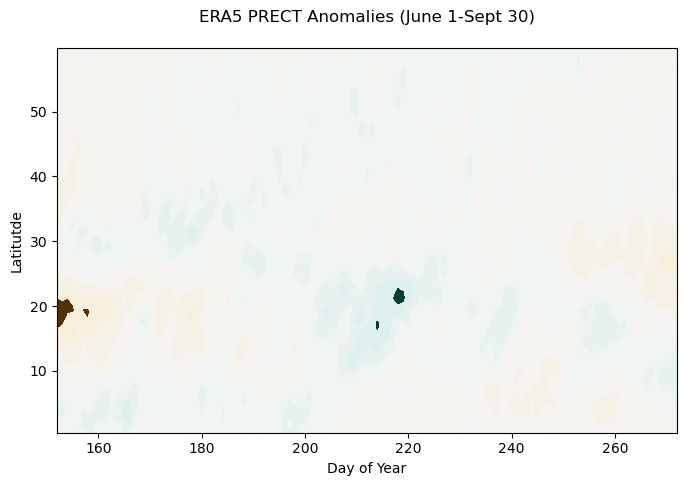

In [181]:
varSel  = 'tp'
var_norm = mpl.colors.Normalize(vmin=-1, vmax=1)
varMult = 1

varAnomalies = varMult * monsoonAnomalies

fig,axs = plt.subplots(1,1,figsize=(8,5))
# axs.contourf(varAnomalies.lat.values, varAnomalies.dayofyear.values, varAnomalies.mean(dim='lon'),
axs.contourf(varAnomalies.dayofyear.values, varAnomalies.lat.values, varAnomalies.mean(dim='lon').transpose(),
             norm=var_norm, cmap='BrBG',extend='both')
# axs.set_xlabel('Latitutde')
# axs.set_ylabel('Day of Year')
axs.set_ylabel('Latitutde')
axs.set_xlabel('Day of Year')
axs.set_title('ERA5 PRECT Anomalies (June 1-Sept 30)\n' )


## Goal: Understand what's driving the decrease in ENSO amplitude?

**Define ENSO phases using monthly data**

Make things play nicely with time array; Doesn't work out when years are 0001 onwards...

In [24]:
from dateutil.relativedelta import relativedelta
def add_months(start_date, num_months):
    return start_date + relativedelta(months=num_months)

def monthly_time_array(start_date, num_months):
    # Convert the start date string to a datetime object
    # start_date = datetime.strptime(start_date, '%Y-%m-%d')

    # Create a list to store the monthly time array
    time_array = []

    # Generate monthly time array
    for i in range(num_months):
        time_array.append(start_date)
        start_date = add_months(start_date, 1)

    return time_array


In [25]:
start_date = datetime.datetime(1850, 1, 1)
num_months = len(all_h0.time.values)
result = monthly_time_array(start_date, num_months)

In [27]:
all_h0['time'] = result

In [29]:
ilats = np.where((all_h0.lat.values>=-5)  & (all_h0.lat.values<=5))[0]
ilons = np.where((all_h0.lon.values>=190) & (all_h0.lon.values<=240))[0]

regionTS = all_h0.TS.isel(lat=ilats, lon=ilons).mean(dim='lat').mean(dim='lon')
climoTS  = regionTS.mean(dim='time')

# nino34 = (regionTS - climoTS).isel(case=3).isel(time=np.where(regionTS['time.year']>=1995)[0])
# nino34 = (regionTS - climoTS).isel(time=np.where(regionTS['time.year']>=1995)[0]).rolling(time=5).mean()
nino34 = (regionTS - climoTS).rolling(time=5).mean()

# nino34['time'] = nino34.indexes['time'].to_datetimeindex() 


In [32]:
## Identify winters that are in different ENSO phases?
#    ENSO active when anomaly +/- 0.4 deg for 6+ months

label_case0 = np.full([len(nino34.time.values)], '---------')

for iTime in range(len(nino34.time.values)-6):
    this6months = nino34.isel(case=0).isel(time=np.arange(iTime,iTime+6))
    
    if (np.all(this6months.values>=0.4)):
        label_case0[iTime+6] = 'ElNino'
    elif (np.all(this6months.values<=0.4)):
        label_case0[iTime+6] = 'LaNina'
    else:
        label_case0[iTime+6] = 'Neutral'


label_case1 = np.full([len(nino34.time.values)], '---------')

for iTime in range(len(nino34.time.values)-6):
    this6months = nino34.isel(case=1).isel(time=np.arange(iTime,iTime+6))
    
    if (np.all(this6months.values>=0.4)):
        label_case1[iTime+6] = 'ElNino'
    elif (np.all(this6months.values<=0.4)):
        label_case1[iTime+6] = 'LaNina'
    else:
        label_case1[iTime+6] = 'Neutral'


KeyboardInterrupt: 

In [ ]:
label_case1

In [ ]:
# If adding to all_h0, need to fill in the F2000 years with something too
fullTime_label = np.full([len(all_h0.time.values)], '---------')
fullTime_label[len(all_h0.time.values) - len(label)::] = label

all_h0['ENSO_label'] = (('time'), fullTime_label)

In [ ]:
## Want to know these phases for the daily data too.
h1_labels = np.full([len(all_h1.time.values)], '-----------')

for iT in range(len(all_h0.time.values)): 
    theseDays = np.where( (all_h1['time.year'].values==all_h0['time.year'].values[iT]) & 
                          (all_h1['time.month'].values==all_h0['time.month'].values[iT]) )[0]

    h1_labels[theseDays] = all_h0['ENSO_label'].values[iT]

all_h1['ENSO_label'] = (('time'), h1_labels)

### How do daily westerly winds differ between the two cases? 

## Comparison?

In [24]:
iTimes_DJF = np.where( (all_h0['time.month']==12) | (all_h0['time.month']<=2) )[0]
iTimes_JJA = np.where( (all_h0['time.month']>=6) & (all_h0['time.month']<=8) )[0]
iTimes_MAM = np.where( (all_h0['time.month']>=3) & (all_h0['time.month']<=5) )[0]
iTimes_SON = np.where( (all_h0['time.month']>=9) & (all_h0['time.month']<=11) )[0]

all_h0_DJF = all_h0.isel(time=iTimes_DJF).mean(dim='time')
all_h0_JJA = all_h0.isel(time=iTimes_JJA).mean(dim='time')
all_h0_MAM = all_h0.isel(time=iTimes_MAM).mean(dim='time')
all_h0_SON = all_h0.isel(time=iTimes_SON).mean(dim='time')
all_h0_ANN = all_h0.mean(dim='time')


h0_DJF_allTimes = all_h0.isel(time=iTimes_DJF)


In [25]:
## Also create ocean-only frac
fillOcnFrac_h0= np.full([5, len(all_h0_DJF.lat.values), len(all_h0_DJF.lon.values)], np.nan)
fillOcnFrac_h0[:,:,:] = all_h0_DJF.OCNFRAC.isel(case=0)
fillOcnFrac_h0[np.where(fillOcnFrac_h0!=1)] = np.nan
## Get means 
fillOcnFrac_h0_mean = fillOcnFrac_h0[0,:,:]
## Also create ocean-only frac with time dimension
fillOcnFrac_h0_allTimes= np.full([len(h0_DJF_allTimes.time.values), len(h0_DJF_allTimes.lat.values), len(h0_DJF_allTimes.lon.values)], np.nan)
fillOcnFrac_h0_allTimes[:,:,:] = h0_DJF_allTimes.OCNFRAC.isel(case=0)
fillOcnFrac_h0_allTimes[np.where(fillOcnFrac_h0_allTimes!=1)] = np.nan

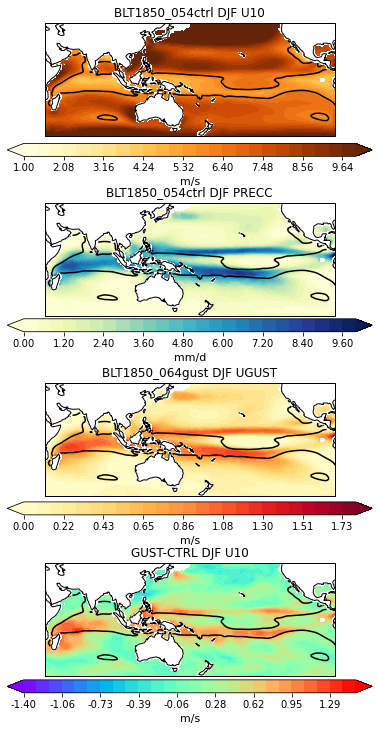

In [10]:
## Wind plot
fig,axs = plt.subplots(4,1, figsize = (11,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 1)/25
u10_pltLims = np.arange(1,10+nstep,nstep)

c = axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF U10')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0+0.01, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
## Add line contours too 
CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())
# axs[0].clabel(CS, inline=True, fontsize=10, fmt='%i')


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot PRECC in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
precc_pltLims = np.arange(0,10+nstep,nstep)

c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 86400*1e3*np.squeeze(all_h0_DJF.isel(case=0).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF PRECC')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0+0.004, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
## Add line contours too 
CS = axs[1].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot UGUST in both gust cases (axs[1] and axs[4])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.8-0)/25
uGust_pltLims = np.arange(0,1.8+nstep,nstep)

c = axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, np.squeeze(all_h0_DJF.isel(case=1).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_DJF.isel(case=1).case.values)+' DJF UGUST')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.011, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[2].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.4*2)/25
diff_pltLims = np.arange(-1.4,1.4+nstep,nstep)

diff2000 = np.squeeze(all_h0_DJF.isel(case=1).U10.values) - np.squeeze(all_h0_DJF.isel(case=0).U10.values)

c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF U10')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[3].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
                    np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

fig.subplots_adjust(hspace=0.6)


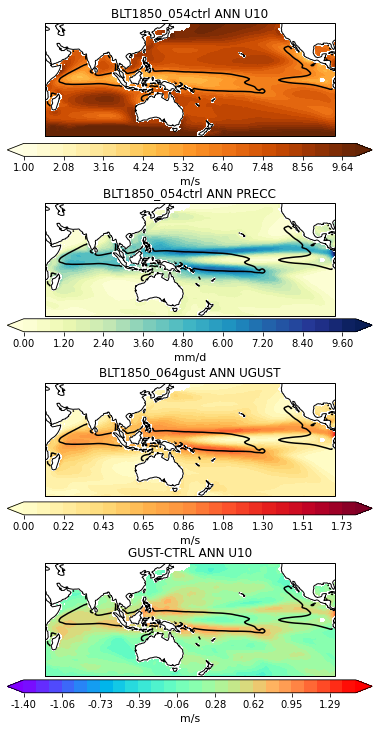

In [14]:
## Wind plot
fig,axs = plt.subplots(4,1, figsize = (11,12), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 1)/25
u10_pltLims = np.arange(1,10+nstep,nstep)

c = axs[0].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, np.squeeze(all_h0_ANN.isel(case=0).U10.values)*fillOcnFrac_h0_mean, 
                u10_pltLims, 
                cmap='YlOrBr',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' ANN U10')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[0].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0+0.01, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
## Add line contours too 
CS = axs[0].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())
# axs[0].clabel(CS, inline=True, fontsize=10, fmt='%i')


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot PRECC in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
precc_pltLims = np.arange(0,10+nstep,nstep)

c = axs[1].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 86400*1e3*np.squeeze(all_h0_ANN.isel(case=0).PRECC.values)*fillOcnFrac_h0_mean, 
                precc_pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=0).case.values)+' ANN PRECC')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0+0.004, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('mm/d',fontsize=11)
## Add line contours too 
CS = axs[1].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot UGUST in both gust cases (axs[1] and axs[4])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.8-0)/25
uGust_pltLims = np.arange(0,1.8+nstep,nstep)

c = axs[2].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, np.squeeze(all_h0_ANN.isel(case=1).UGUST.values)*fillOcnFrac_h0_mean, 
                uGust_pltLims, 
                cmap='YlOrRd',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title(str(all_h0_DJF.isel(case=1).case.values)+' ANN UGUST')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[2].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.011, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[2].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (1.4*2)/25
diff_pltLims = np.arange(-1.4,1.4+nstep,nstep)

diff2000 = np.squeeze(all_h0_ANN.isel(case=1).U10.values) - np.squeeze(all_h0_ANN.isel(case=0).U10.values)

c = axs[3].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, diff2000*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL ANN U10')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.02, ax_position.width, 0.015])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.2f')
cbar.set_label('m/s',fontsize=11)
# Add line contour
CS = axs[3].contour(all_h0_ANN.lon.values, all_h0_ANN.lat.values, 
                    np.squeeze(all_h0_ANN.isel(case=0).U10.values)*fillOcnFrac_h0_mean, [0, 6], 
               colors='k',  transform=ccrs.PlateCarree())

fig.subplots_adjust(hspace=0.6)


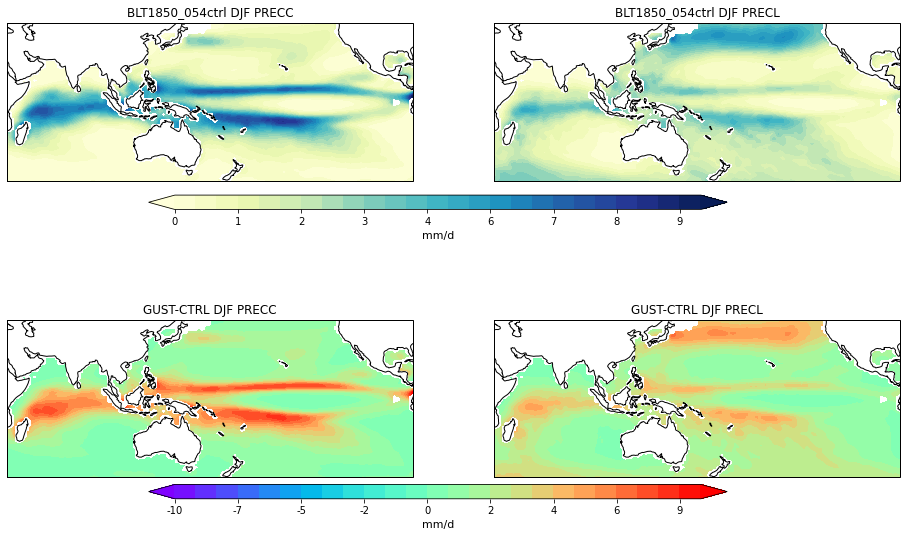

In [11]:
## PRECC/PRECT plot
fig,axs = plt.subplots(2,2, figsize = (16,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
axs     = axs.ravel()

mult = 86400*1e3 # Convert m/s to mm/d

## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot U10 in both control cases (axs[0] and axs[3])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10 - 0)/25
pltLims = np.arange(0,10+nstep,nstep)

axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=0)['PRECC'].values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF PRECC')
axs[0].coastlines()
axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# ## Add line contours too 
# CS = axs[0].contour(all_h0_DJF.lon.values, all_h0_DJF.lat.values, 
#                     np.squeeze(all_h0_DJF.isel(case=0).U10.values)*fillOcnFrac_h0_mean, levels=[0,1,2,3,4,5,6], colors='k')
# axs[0].clabel(CS, inline=True, fontsize=10)


c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=0)['PRECL'].values)*fillOcnFrac_h0_mean, 
                pltLims, 
                cmap='YlGnBu',extend='both',transform=ccrs.PlateCarree())
axs[1].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF PRECL')
axs[1].coastlines()
axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[1].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.04, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)


## - - - - - - - - - - - - - - - - - - - - - - - - - 
## Plot the difference in U10 (GUST-CTRL), (axs[2] and axs[5])
## - - - - - - - - - - - - - - - - - - - - - - - - - 
nstep = (10*2)/25
diff_pltLims = np.arange(-10,10+nstep,nstep)

diffPRECC = mult*np.squeeze(all_h0_DJF.isel(case=1)['PRECC'].values) - np.squeeze(all_h0_DJF.isel(case=0)['PRECC'].values)
diffPRECL = mult*np.squeeze(all_h0_DJF.isel(case=1)['PRECL'].values) - np.squeeze(all_h0_DJF.isel(case=0)['PRECL'].values)

axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffPRECC*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[2].set_title('GUST-CTRL DJF PRECC')
axs[2].coastlines()
axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())


c = axs[3].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffPRECL*fillOcnFrac_h0_mean, 
                diff_pltLims, 
                cmap='rainbow',extend='both',transform=ccrs.PlateCarree())
axs[3].set_title('GUST-CTRL DJF PRECL')
axs[3].coastlines()
axs[3].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
# Add colorbar
ax_position = axs[3].get_position()
cbar_ax     = fig.add_axes([ax_position.x0-0.3, ax_position.y0-0.03, ax_position.width+0.15, 0.02])
cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%i')
cbar.set_label('mm/d',fontsize=11)

plt.show()


In [11]:
def plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim): 
    
    fig, axs = plt.subplots(3,1, figsize=(10,11), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

    axs[0].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=0)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[0].set_title(str(all_h0_DJF.isel(case=0).case.values)+' DJF '+varSel)
    axs[0].coastlines()
    axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

    c = axs[1].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, mult*np.squeeze(all_h0_DJF.isel(case=1)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[1].set_title(str(all_h0_DJF.isel(case=1).case.values)+' DJF '+varSel)
    axs[1].coastlines()
    axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    # cbar.set_label(unitsString,fontsize=11)

    diffs = (mult*np.squeeze(all_h0_DJF.isel(case=1)[varSel].values)) - (mult*np.squeeze(all_h0_DJF.isel(case=0)[varSel].values))

    c = axs[2].contourf(all_h0_DJF.lon.values, all_h0_DJF.lat.values, diffs*fillOcnFrac_h0_mean, 
                    dlim, 
                    cmap='seismic', extend='both',transform=ccrs.PlateCarree())
    axs[2].set_title('GUST-CTRL DJF '+varSel)
    axs[2].coastlines()
    axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[2].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    cbar.set_label(unitsString,fontsize=11)

    fig.subplots_adjust(hspace=0.4)

    
    return axs

In [17]:
def plot_ANNmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim): 
    
    fig, axs = plt.subplots(3,1, figsize=(10,11), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})

    axs[0].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, mult*np.squeeze(all_h0_ANN.isel(case=0)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[0].set_title(str(all_h0_ANN.isel(case=0).case.values)+' ANN '+varSel)
    axs[0].coastlines()
    axs[0].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())

    c = axs[1].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, mult*np.squeeze(all_h0_ANN.isel(case=1)[varSel].values)*fillOcnFrac_h0_mean, 
                    pltLims, 
                    cmap=plt_cmap,extend='both',transform=ccrs.PlateCarree())
    axs[1].set_title(str(all_h0_ANN.isel(case=1).case.values)+' ANN '+varSel)
    axs[1].coastlines()
    axs[1].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[1].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.01, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    # cbar.set_label(unitsString,fontsize=11)

    diffs = (mult*np.squeeze(all_h0_ANN.isel(case=1)[varSel].values)) - (mult*np.squeeze(all_h0_ANN.isel(case=0)[varSel].values))

    c = axs[2].contourf(all_h0_ANN.lon.values, all_h0_ANN.lat.values, diffs*fillOcnFrac_h0_mean, 
                    dlim, 
                    cmap='seismic', extend='both',transform=ccrs.PlateCarree())
    axs[2].set_title('GUST-CTRL ANN '+varSel)
    axs[2].coastlines()
    axs[2].set_extent([38,280,-47,47], crs=ccrs.PlateCarree())
    # Add colorbar
    ax_position = axs[2].get_position()
    cbar_ax     = fig.add_axes([ax_position.x0, ax_position.y0-0.04, ax_position.width, 0.015])
    cbar        = plt.colorbar(c, orientation='horizontal',cax=cbar_ax,format='%.1f')
    cbar.set_label(unitsString,fontsize=11)

    fig.subplots_adjust(hspace=0.4)

    
    axs[0].set_extent([0,359,-65,75], crs=ccrs.PlateCarree())
    axs[1].set_extent([0,359,-65,75], crs=ccrs.PlateCarree())
    axs[2].set_extent([0,359,-65,75], crs=ccrs.PlateCarree())

    
    return axs

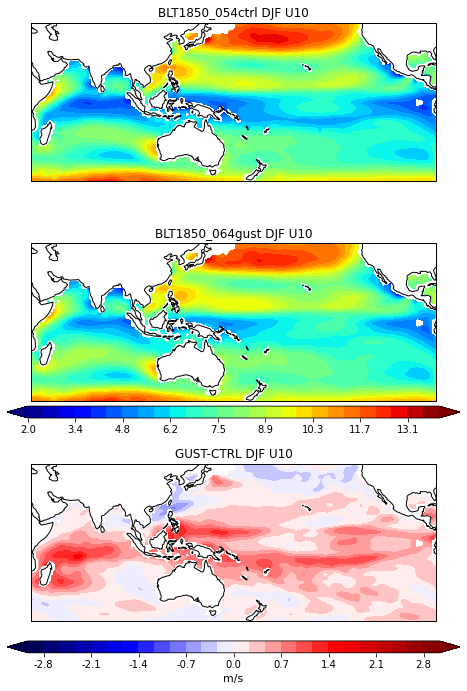

In [13]:
varSel = 'U10' 
unitsString = all_h0['U10'].units

mult = 1

plt_cmap = 'jet'

cMin = 2
cMax = 14 
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 3
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


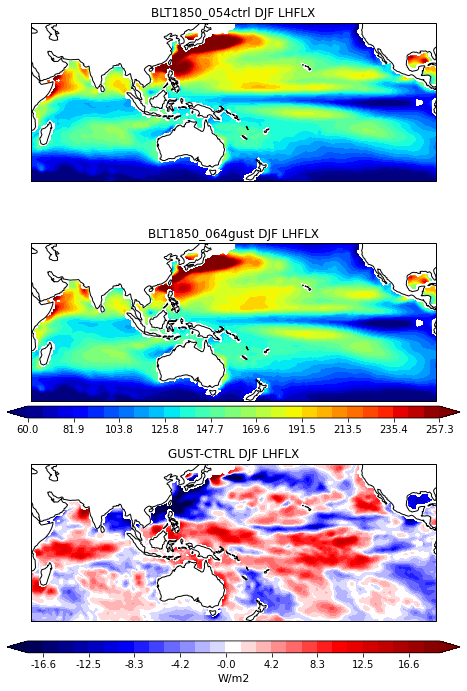

In [14]:
varSel = 'LHFLX' 
unitsString = all_h0['LHFLX'].units

mult = 1

plt_cmap = 'jet'

cMin = 60
cMax = 250
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 18
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


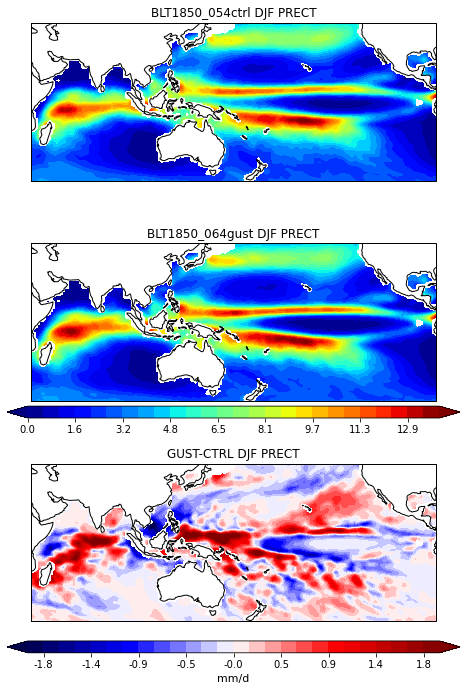

In [12]:
varSel = 'PRECT' 
unitsString = all_h0['PRECT'].units

mult = 86400*1000

plt_cmap = 'jet'

cMin = 0
cMax = 14
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 2
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, 'mm/d', mult, plt_cmap, pltLims, dlim)


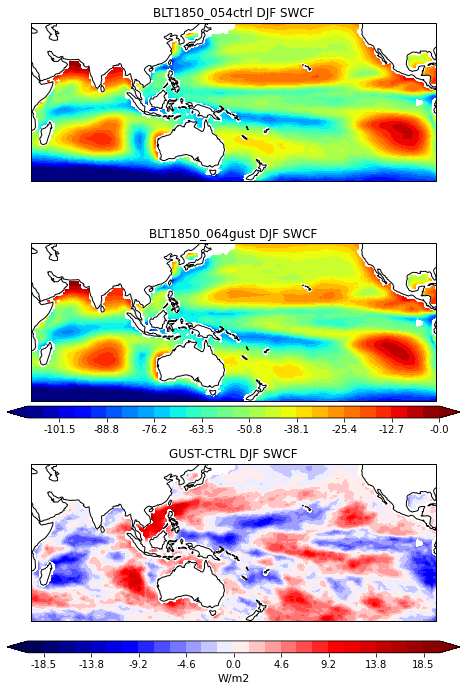

In [16]:
varSel = 'SWCF' 
unitsString = all_h0['SWCF'].units

mult = 1

plt_cmap = 'jet'

cMin = -110
cMax = 0
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 20
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


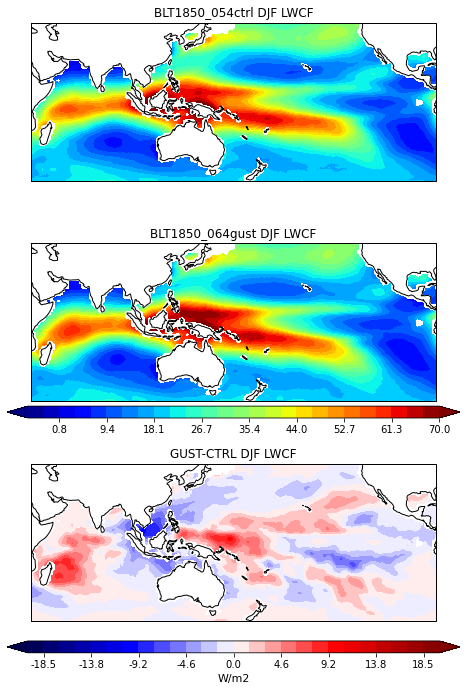

In [17]:
varSel = 'LWCF' 
unitsString = all_h0['LWCF'].units

mult = 1

plt_cmap = 'jet'

cMin = -5
cMax = 70
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 20
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


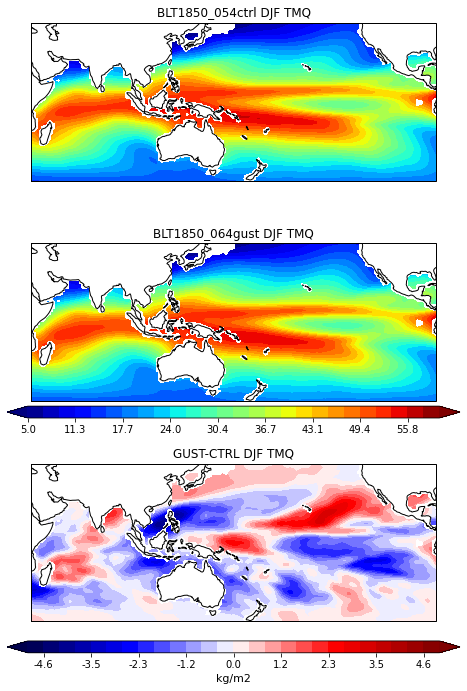

In [18]:
varSel = 'TMQ' 
unitsString = all_h0['TMQ'].units

mult = 1

plt_cmap = 'jet'

cMin = 5
cMax = 60
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 5
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_DJFmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


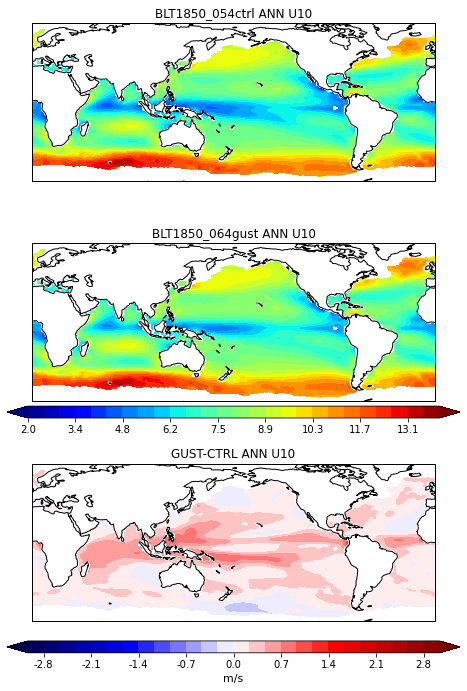

In [18]:
varSel = 'U10' 
unitsString = all_h0['U10'].units

mult = 1

plt_cmap = 'jet'

cMin = 2
cMax = 14 
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 3
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_ANNmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


In [ ]:
varSel = 'PRECT' 
unitsString = all_h0['PRECT'].units

mult = 1

plt_cmap = 'jet'

cMin = 2
cMax = 14 
cStep = (cMax-cMin)/26
pltLims = np.arange(cMin,cMax+cStep, cStep)

dMax = 3
dStep = (2*dMax)/26
dlim = np.arange(-dMax, dMax+dStep, dStep)

axs = plot_ANNmean(varSel, unitsString, mult, plt_cmap, pltLims, dlim)


In [29]:
def plotDistribution(minLat,maxLat,minLon,maxLon, regionTitle, 
                     DS_h1, DS_h0, varName, unitsString,
                     # DS_obs, obsVarName,
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=None, 
                     ):
    
    ## - - - - - - - - - - - - - - - - - 
    ## Select data     
    ## - - - - - - - - - - - - - - - - - 
    # Get season
    if season=='JJA':
        # iTime_h1 = np.where( (DS_h1['time.month']>=monStart) & (DS_h1['time.month']<=monEnd) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']>=monStart) & (DS_h0['time.month']<=monEnd) )[0]
    elif season=='DJF':
        iTime_h1 = np.where( (DS_h1['time.month']==12) | (DS_h1['time.month']<=2) )[0]
        iTime_h0 = np.where( (DS_h0['time.month']==12) | (DS_h0['time.month']<=2) )[0]
    
    # Get lat and lon too
    iLat  = np.where( (DS_h0['lat']>=minLat) & (DS_h0['lat']<=maxLat) )[0]
    iLon  = np.where( (DS_h0['lon']>=minLon) & (DS_h0['lon']<=maxLon) )[0]
    
    if timeFreq=='daily': 
        mainDS = DS_h1.isel(time=iTime_h1, lat=iLat, lon=iLon)
    elif timeFreq=='monthly':
        mainDS = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon)

    ## Get ocean mask 
    fillOcnFrac = np.full([len(mainDS.case.values), len(mainDS.time.values), len(mainDS.lat.values), len(mainDS.lon.values)], np.nan)
    fillOcnFrac[:,:,:,:] = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon).OCNFRAC.isel(case=0, time=12)
    fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

    ## - - - - - - - - - - - - - - - - - 
    ## Plot the distribution 
    ## - - - - - - - - - - - - - - - - - 

    oceanVar = mainDS[varName ]* valueMultiplier * fillOcnFrac

    if varMin: 
        oceanVar   = oceanVar.where(oceanVar>varMin)
        
    if varMax: 
        oceanVar   = oceanVar.where(oceanVar<varMax)


    numEl = len(oceanVar.lat.values)*len(oceanVar.lon.values)*len(oceanVar.time.values)  
    
    
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=0).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=0).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=1).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=1).case.values)}),
             # pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=2).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=2).case.values)}),
             # pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=3).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=3).case.values)}),
             # pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=4).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=4).case.values)}),
             ])

    # Make plot 
    g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                    log_scale=True, 
                    common_norm = False, alpha=0.7,
                     # palette=['grey','deepskyblue','blue','purple','deeppink'])
                     palette=['black','orangered'])

    g.ax.set_xlabel(unitsString,fontsize=16)
    g.ax.set_ylabel('Probability Density',fontsize=16)
    g.ax.tick_params(axis='both', labelsize= 14)
    g.ax.set_title(season+' '+regionTitle+' '+timeFreq+' '+varName+' (No avg in time/space)',fontsize=16)
    plt.setp(g._legend.get_title(), fontsize=14)
    plt.setp(g._legend.get_texts(), fontsize=14)

    
    return


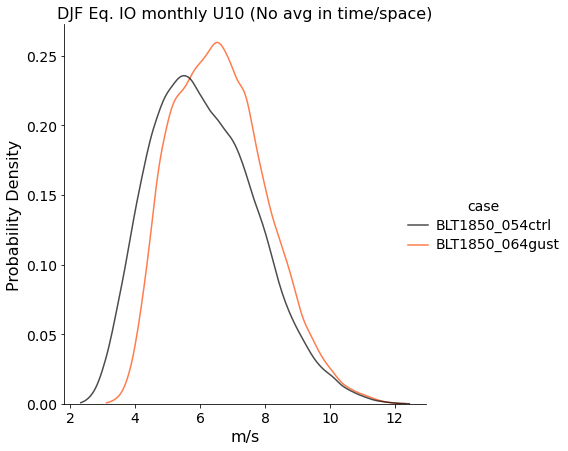

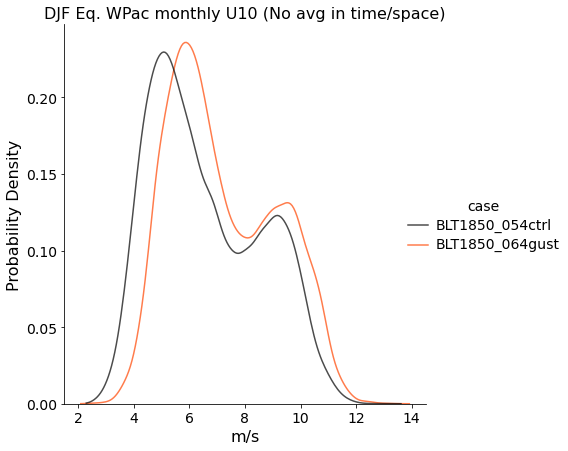

In [20]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=15,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=15, 
                     )



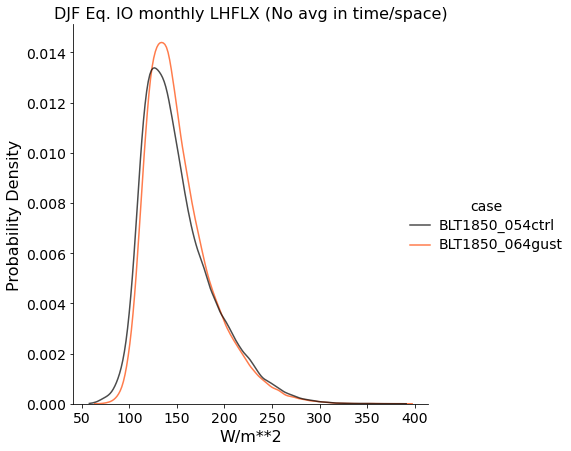

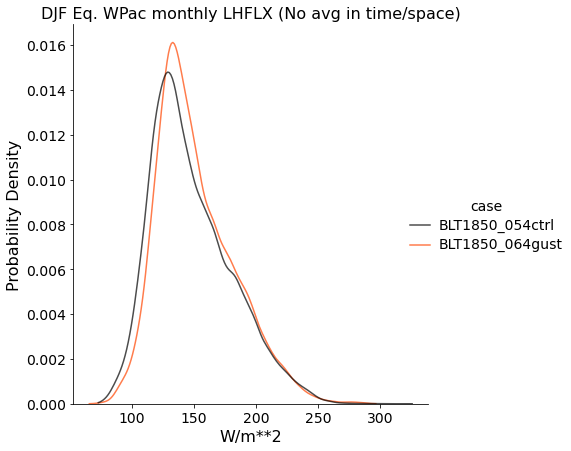

In [21]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=400,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'LHFLX', 
                     'W/m**2',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=400, 
                     )



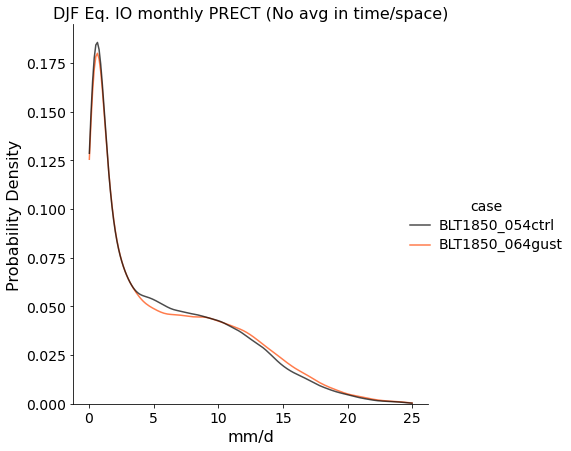

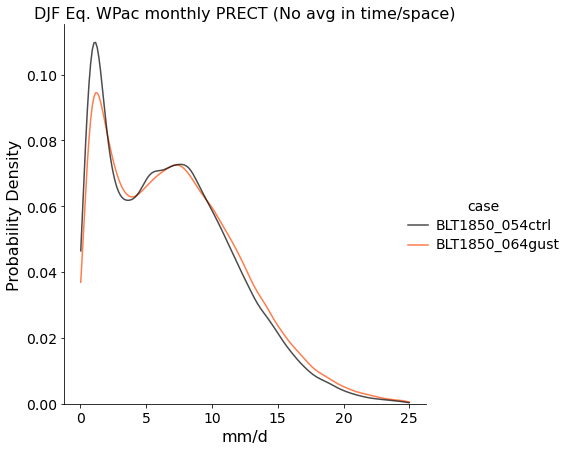

In [22]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=25,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=25,
                     )



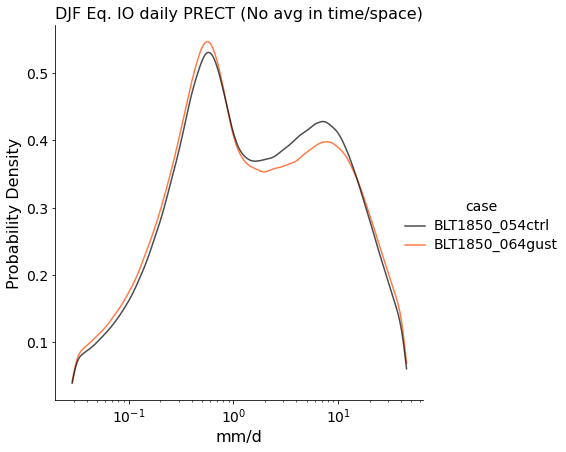

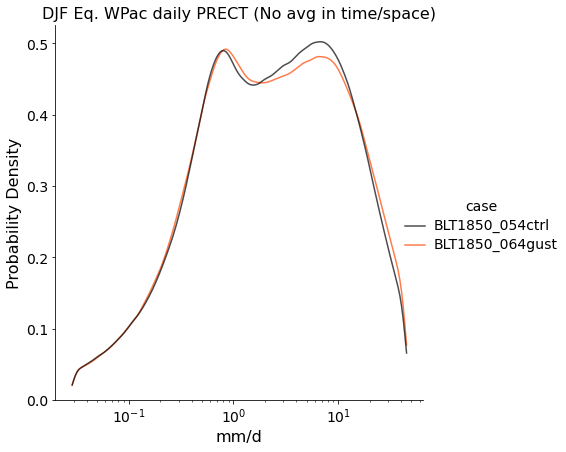

In [33]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=65,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=65,
                     )



Full tropics

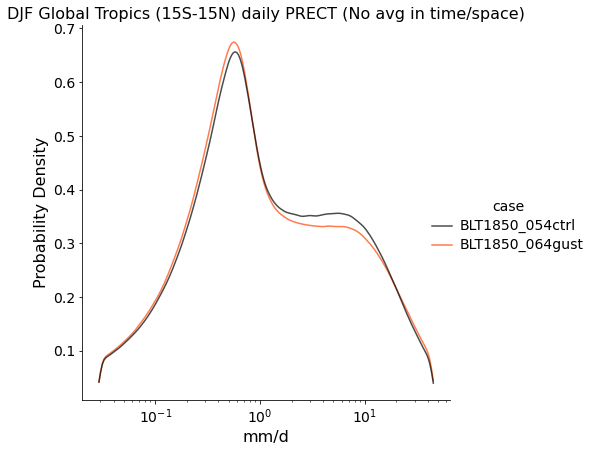

In [34]:
plotDistribution(-15,15,0,359, 'Global Tropics (15S-15N)', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='daily',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=45,
                     )

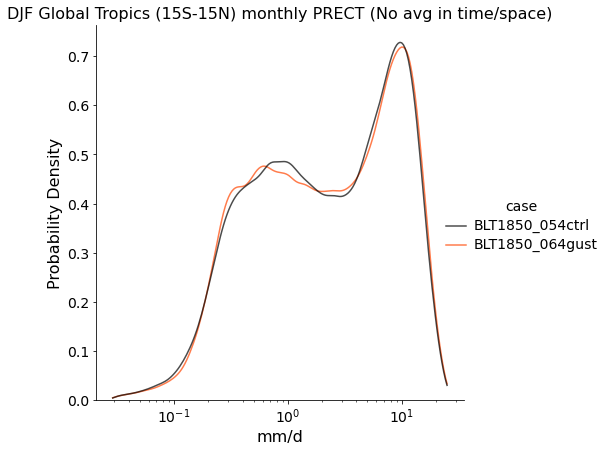

In [27]:
# plotDistribution(-15,15,0,359, 'Global Tropics (15S-15N)', 
#                      all_h1, all_h0, 'U10', 
#                      'm/s',
#                      season='DJF', timeFreq='monthly',
#                      valueMultiplier=1, varMin=None, varMax=15,
#                      )

# plotDistribution(-15,15,0,359, 'Global Tropics (15S-15N)', 
#                      all_h1, all_h0, 'LHFLX', 
#                      'W/m**2',
#                      season='DJF', timeFreq='monthly',
#                      valueMultiplier=1, varMin=None, varMax=300,
#                      )

plotDistribution(-15,15,0,359, 'Global Tropics (15S-15N)', 
                     all_h1, all_h0, 'PRECT', 
                     'mm/d',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=86400*1e3, varMin=0.029, varMax=25,
                     )

## All cases

In [8]:
testDir     = '/glade/derecho/scratch/hannay/archive/'

case_IDs  = [
               '#54',
               '#61',
               '#64',    
               '#65',    
               '#66',    
               '#67',    

              ]

caseNames = [
            'b.e23_alpha16b.BLT1850.ne30_t232.054', 
            'b.e23_alpha16g.BLT1850.ne30_t232.061',
            'b.e23_alpha16g.BLT1850.ne30_t232.064',
            'b.e23_alpha16g.BLT1850.ne30_t232.065',
            'b.e23_alpha16g.BLT1850.ne30_t232.066',
            'b.e23_alpha16g.BLT1850.ne30_t232.067',
]    

for iCase in range(len(case_IDs)):
    print('*** Starting on case %s ***' % (case_IDs[iCase]))

    ## Get list of files with certain years only
    listFiles_h0_1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.000?-*'))
    listFiles_h1_1 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.000?-*'))
    
    listFiles_h0_2 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.001?-*'))
    listFiles_h1_2 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.001?-*'))  
    
    listFiles_h0_3 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h0.002?-*'))
    listFiles_h1_3 = np.sort(glob.glob(testDir+caseNames[iCase]+'/atm/hist/*cam.h2.002?-*'))  
    
    listFiles_h0 = np.concatenate([listFiles_h0_1, listFiles_h0_2, listFiles_h0_3])
    listFiles_h1 = np.concatenate([listFiles_h1_1, listFiles_h1_2, listFiles_h1_3])
    
    
    ## Now read in those files
    case_h0 = xr.open_mfdataset(listFiles_h0,  preprocess=preprocess_h0, concat_dim='time', 
                                combine='nested', decode_times=False, 
                                data_vars='minimal')
    print('h0 files loaded')
    # case_h1 = xr.open_mfdataset(listFiles_h1,  preprocess=preprocess_h2, concat_dim='time', 
    #                             combine='nested', decode_times=False, 
    #                             data_vars='minimal')
    # print('h1 files loaded')
    
    ## Add case ID (short name) to the DS
    case_h0      = case_h0.squeeze().assign_coords({"case":  case_IDs[iCase]})
    # case_h1      = case_h1.squeeze().assign_coords({"case":  case_IDs[iCase]})
    
    ## Info on dates available
    print('Min year (h0): ', np.nanmin(case_h0['time.year'].values))
    print('Max year (h0): ', np.nanmax(case_h0['time.year'].values))
    # print('Min year (h1): ', np.nanmin(case_h1['time.year'].values))
    # print('Max year (h1): ', np.nanmax(case_h1['time.year'].values))
    
    ## Return all the cases in a single dataset
    if iCase==0:
        all_h0    = case_h0
        del case_h0
        # all_h1 = case_h1
        # del case_h1
    else: 
        all_h0    = xr.concat([all_h0, case_h0], "case") 
        del case_h0
        # all_h1 = xr.concat([all_h1, case_h1], "case") 
        # del case_h1
    

*** Starting on case #54 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  29
*** Starting on case #61 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  29
*** Starting on case #64 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  29
*** Starting on case #65 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  12
*** Starting on case #66 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  14
*** Starting on case #67 ***
h0 files loaded
Min year (h0):  1
Max year (h0):  13


In [9]:
## Drop the first year for spin-up? And select only the years that we want?

iTimes_h0 = np.where((all_h0['time.year'].values>1) & (all_h0['time.year'].values<=12))[0]
# iTimes_h1 = np.where((all_h1['time.year'].values>1) & (all_h1['time.year'].values<=12))[0]

all_h0 = all_h0.isel(time=iTimes_h0)
# all_h1 = all_h1.isel(time=iTimes_h1)


In [10]:
def plotDistribution(minLat,maxLat,minLon,maxLon, regionTitle, 
                      DS_h0, varName, unitsString,
                     # DS_obs, obsVarName,
                     season='DJF', timeFreq='daily',
                     valueMultiplier=1, varMin=None, varMax=None, 
                     ):
    
    ## - - - - - - - - - - - - - - - - - 
    ## Select data     
    ## - - - - - - - - - - - - - - - - - 
    # Get season
    if season=='JJA':
        iTime_h0 = np.where( (DS_h0['time.month']>=monStart) & (DS_h0['time.month']<=monEnd) )[0]
    elif season=='DJF':
        iTime_h0 = np.where( (DS_h0['time.month']==12) | (DS_h0['time.month']<=2) )[0]
    
    # Get lat and lon too
    iLat  = np.where( (DS_h0['lat']>=minLat) & (DS_h0['lat']<=maxLat) )[0]
    iLon  = np.where( (DS_h0['lon']>=minLon) & (DS_h0['lon']<=maxLon) )[0]
    
    mainDS = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon)

    ## Get ocean mask 
    fillOcnFrac = np.full([len(mainDS.case.values), len(mainDS.time.values), len(mainDS.lat.values), len(mainDS.lon.values)], np.nan)
    fillOcnFrac[:,:,:,:] = DS_h0.isel(time=iTime_h0, lat=iLat, lon=iLon).OCNFRAC.isel(case=0, time=12)
    fillOcnFrac[np.where(fillOcnFrac!=1)] = np.nan

    ## - - - - - - - - - - - - - - - - - 
    ## Plot the distribution 
    ## - - - - - - - - - - - - - - - - - 

    oceanVar = mainDS[varName ]* valueMultiplier * fillOcnFrac

    if varMin: 
        oceanVar   = oceanVar.where(oceanVar>varMin)
        
    if varMax: 
        oceanVar   = oceanVar.where(oceanVar<varMax)


    numEl = len(oceanVar.lat.values)*len(oceanVar.lon.values)*len(oceanVar.time.values)  
    
    
    dfReal = pd.concat(axis=0, ignore_index=True, objs=[
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=0).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=0).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=1).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=1).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=2).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=2).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=3).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=3).case.values)}),
             pd.DataFrame.from_dict({varName: np.squeeze(oceanVar.isel(case=4).values.reshape(numEl,1)), 'case': str(oceanVar.isel(case=4).case.values)}),
             ])

    # Make plot 
    g = sns.displot(dfReal, x=varName, hue='case', kind='kde', height=6, cut=0, 
                    log_scale=True, 
                    common_norm = False, alpha=0.7,
                     palette=['black','forestgreen','blue','purple','darkorange'])
                     # palette=['black','orangered'])

    g.ax.set_xlabel(unitsString,fontsize=16)
    g.ax.set_ylabel('Probability Density',fontsize=16)
    g.ax.tick_params(axis='both', labelsize= 14)
    g.ax.set_title(season+' '+regionTitle+' '+timeFreq+' '+varName+' (No avg in time/space)',fontsize=16)
    plt.setp(g._legend.get_title(), fontsize=14)
    plt.setp(g._legend.get_texts(), fontsize=14)

    
    return


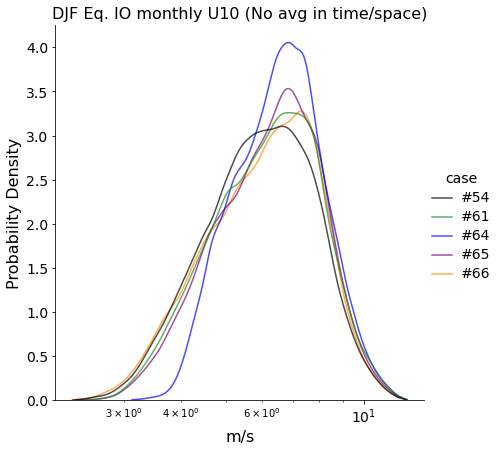

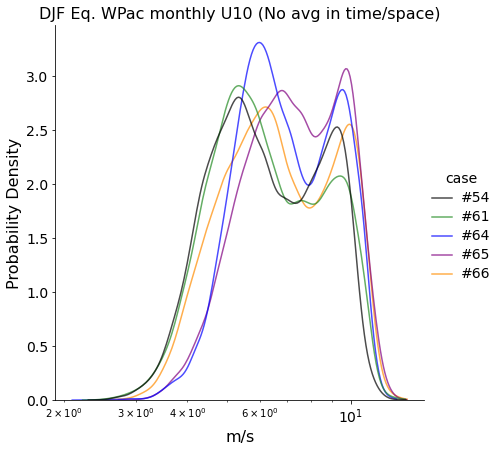

In [11]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=15,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h0, 'U10', 
                     'm/s',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=None, varMax=15, 
                     )



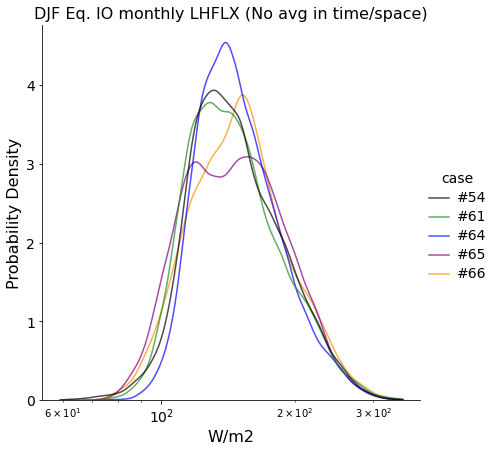

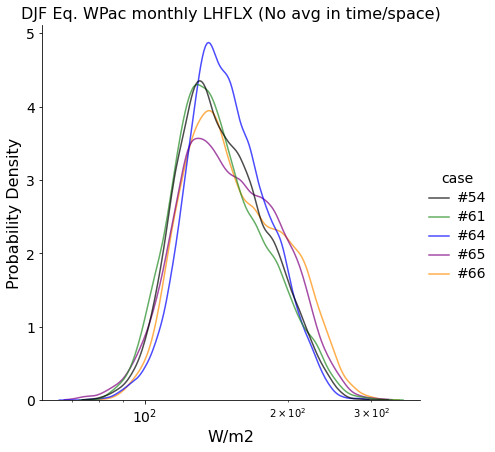

In [17]:
plotDistribution(-15,15,40,105, 'Eq. IO', 
                     all_h0, 'LHFLX', 
                     'W/m2',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=40, varMax=350,
                     )

plotDistribution(-15,15,120,180, 'Eq. WPac', 
                     all_h0, 'LHFLX', 
                     'W/m2',
                     season='DJF', timeFreq='monthly',
                     valueMultiplier=1, varMin=40, varMax=350, 
                     )

